In [1]:
import matplotlib.pyplot as plt
import json
import pandas as pd
import datetime
import csv
import math
import numpy as np
from scipy.stats import pearsonr,spearmanr,kendalltau
from fastdtw import fastdtw
from scipy.spatial.distance import euclidean

In [2]:
path = 'D://小羽飞刀/算法/行号预测负载/Data-'
suffix = '.csv'
alldata = {}
alldata2 = {}
for num in range(1,11):
    alldata[num] = {}
    with open(path+str(num)+suffix, 'r', newline='',encoding='utf-8-sig') as csvfile:
        spamreader = csv.reader(csvfile)
        next(spamreader) # 跳过表头
        for row in spamreader:
            tempTime = datetime.datetime.strptime(row[0],"%M:%S.%f")
            tempSpeed = int(row[1])
            tempFeed = int(row[2])
            tempLoad = int(row[3])
            tempLine = int(row[4])
            if tempLine in alldata[num]:
                new = pd.DataFrame([[tempTime,tempSpeed,tempFeed,tempLoad,tempLine]],columns=['time','speed','feed','load','line'])
                alldata[num][tempLine] = pd.concat([alldata[num][tempLine], new], ignore_index=True)
            else:
                alldata[num][tempLine] = pd.DataFrame([[tempTime,tempSpeed,tempFeed,tempLoad,tempLine]],columns=['time','speed','feed','load','line'])
            if tempLoad < 500:
                if num in alldata2:
                    new = pd.DataFrame([[tempTime,tempSpeed,tempFeed,tempLoad,tempLine]],columns=['time','speed','feed','load','line'])
                    alldata2[num] = pd.concat([alldata2[num], new], ignore_index=True)
                else:
                    alldata2[num] = pd.DataFrame([[tempTime,tempSpeed,tempFeed,tempLoad,tempLine]],columns=['time','speed','feed','load','line'])
for num in alldata:
    for line in alldata[num]:
        alldata[num][line] = alldata[num][line].sort_values(by='time')
for num in alldata2:
    alldata2[num] = alldata2[num].sort_values(by='time')
allset = set(alldata[1].keys())
#print(len(allset))
for num in range(2,11):
    allset = set(allset.intersection(set(alldata[num].keys())))
    #print(len(allset))
allline = list(allset)

In [3]:
refline = []
for line in alldata[1]:
    if len(alldata[1][line]) > 4:
        refline.append(line)
print(refline)

refdata = {}
for num in range(1,11):
    for i in range(len(refline)):
        tempdata = alldata2[num].loc[alldata2[num]['line'] == refline[i]]
        if num in refdata:
            new = pd.DataFrame([[refline[i],refline[i],list(tempdata['load'])]],columns=['start','end','loads'])
            refdata[num] = pd.concat([refdata[num], new], ignore_index=True)
        else:
            refdata[num] = pd.DataFrame([[refline[i],refline[i],list(tempdata['load'])]],columns=['start','end','loads'])
        tempstart = refline[i] + 1
        tempend = refline[i] + 1
        if i < len(refline) - 1:
            if tempstart == refline[i + 1]:
                # 无中间段 跳过
                continue
            tempend = refline[i + 1] - 1
        else:
            tempend = 10000
        tempdata = alldata2[num].loc[(alldata2[num]['line'] >= tempstart) & (alldata2[num]['line'] <= tempend)]
        new = pd.DataFrame([[tempstart,tempend,list(tempdata['load'])]],columns=['start','end','loads'])
        refdata[num] = pd.concat([refdata[num], new], ignore_index=True)
print(refdata)

[0, 10, 12, 15, 19, 20, 21, 22, 31, 46, 55, 56, 81, 91, 116, 126, 151, 186, 221, 256, 291, 326, 361, 396, 431, 466, 501, 536, 571, 606, 641, 678]
{1:     start    end                                              loads
0       0      0  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
1       1      9                                             [0, 0]
2      10     10          [440, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
3      11     11                                                [0]
4      12     12  [372, 194, 81, 123, 61, 47, 42, 40, 38, 38, 37...
5      13     14                                       [40, 38, 37]
6      15     15                               [37, 37, 36, 36, 35]
7      16     18           [58, 117, 164, 154, 104, 74, 59, 53, 73]
8      19     19                          [112, 170, 150, 170, 191]
9      20     20      [186, 145, 126, 127, 125, 120, 114, 108, 148]
10     21     21             [177, 133, 98, 94, 110, 115, 116, 130]
11     22     22                  

In [4]:
def calculate_euclid(point_a, point_b):
    #dist = np.linalg.norm(x-y)
    dist = math.sqrt((point_a - point_b)**2)
    return dist


def calculate_frechet_distance(dp,i,j,curve_a,curve_b):
    if dp[i][j] > -1:
        return dp[i][j]
    elif i == 0 and j == 0:
        dp[i][j] = calculate_euclid(curve_a[0],curve_b[0])
    elif i > 0 and j == 0:
        dp[i][j] = max(calculate_frechet_distance(dp, i - 1, 0, curve_a, curve_b),
                       calculate_euclid(curve_a[i],curve_b[0]))
    elif i == 0 and j > 0:
        dp[i][j] = max(calculate_frechet_distance(dp, 0, j - 1, curve_a, curve_b),
                       calculate_euclid(curve_a[0],curve_b[j]))
    elif i > 0 and j > 0:
        dp[i][j] = max(min(calculate_frechet_distance(dp, i - 1, j, curve_a, curve_b),
                           calculate_frechet_distance(dp, i - 1, j - 1, curve_a, curve_b),
                           calculate_frechet_distance(dp, i, j - 1, curve_a, curve_b)),
                       calculate_euclid(curve_a[i],curve_b[j]))
    else:
        dp[i][j] = float("inf")
    return dp[i][j]


def getsimilarity(curve_a,curve_b):
    dp = np.ones((len(curve_a), len(curve_b)))
    dp = np.multiply(dp,-1)
    similarity = calculate_frechet_distance(dp, len(curve_a) - 1, len(curve_b) - 1, curve_a, curve_b)
    #return max(np.array(dp).reshape(-1,1))[0]
    return similarity

In [5]:
yst = list(refdata[1].iloc[4]['loads'])
y = list(refdata[2].iloc[4]['loads'])
print(np.array(yst))
print(np.array(y))
distance, path = fastdtw(np.array(yst),np.array(y))
print(distance)
print(path)

[372 194  81 123  61  47  42  40  38  38  37  37  38]
[298 180  96  70  53  42  38  36  35  35  36]
154.0
[(0, 0), (1, 1), (2, 2), (3, 2), (4, 3), (5, 4), (6, 5), (7, 6), (8, 6), (9, 6), (10, 7), (11, 8), (11, 9), (12, 10)]


In [6]:
testfrechet = getsimilarity(yst,y)
print(testfrechet)

74.0


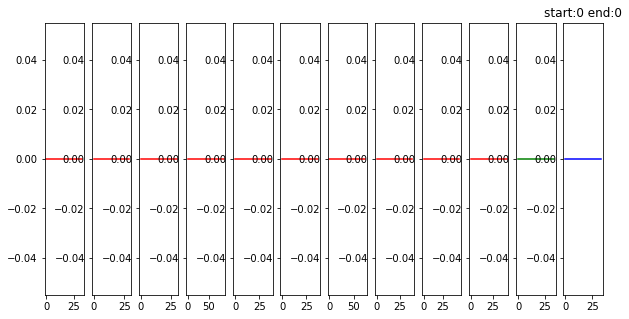

Frechet 距离: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
FastDTW 距离: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


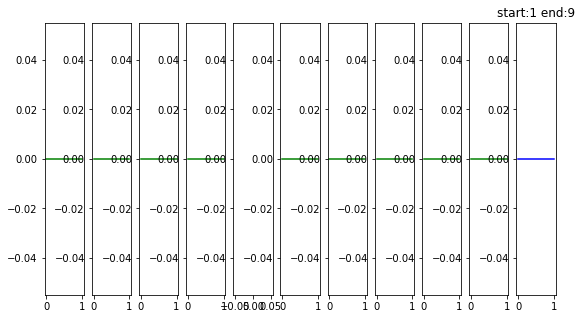

Frechet 距离: [0.0, 0.0, 0.0, 0.0, inf, 0.0, 0.0, 0.0, 0.0, 0.0]
FastDTW 距离: [0.0, 0.0, 0.0, 0.0, inf, 0.0, 0.0, 0.0, 0.0, 0.0]


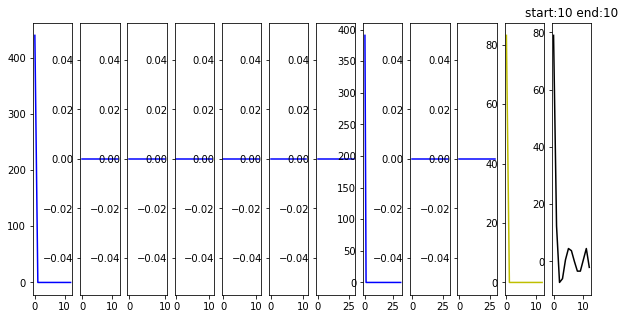

Frechet 距离: [356.9, 83.1, 83.1, 83.1, 83.1, 83.1, 83.1, 307.9, 83.1, 83.1]
FastDTW 距离: [356.9, 83.1, 83.1, 83.1, 83.1, 83.1, 83.1, 307.9, 83.1, 83.1]


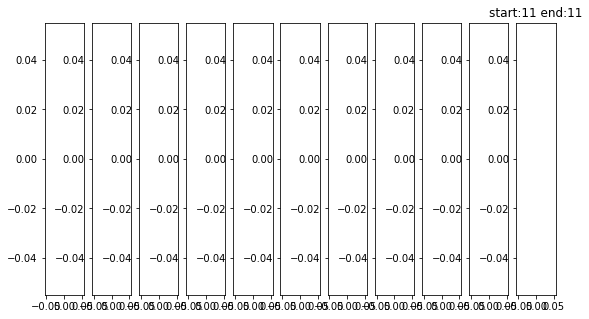

Frechet 距离: [inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]
FastDTW 距离: [inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]


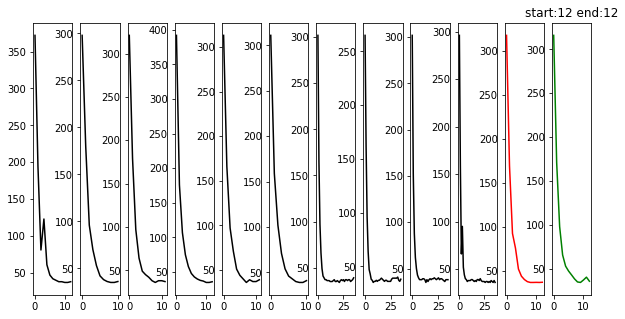

Frechet 距离: [54.80000000000001, 19.19999999999999, 12.099999999999994, 74.80000000000001, 5.099999999999994, 10.099999999999994, 15.199999999999989, 52.19999999999999, 17.099999999999994, 26.700000000000003]
FastDTW 距离: [146.69999999999996, 51.899999999999984, 39.100000000000016, 114.60000000000002, 24.399999999999977, 47.39999999999997, 77.10000000000005, 113.9, 76.9, 103.5]


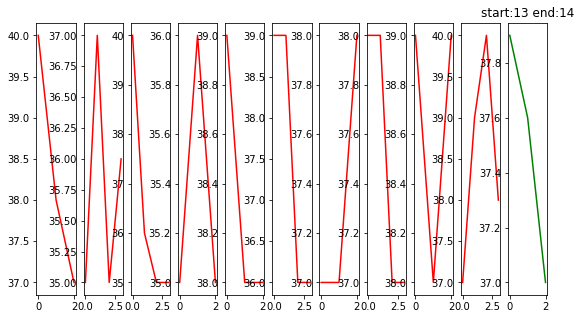

Frechet 距离: [2.1000000000000014, 2.8999999999999986, 2.1000000000000014, 2.8999999999999986, 1.1000000000000014, 1.3999999999999986, 1.0, 0.3999999999999986, 2.0, 2.1000000000000014]
FastDTW 距离: [2.5, 6.5, 7.700000000000003, 6.5, 2.5, 4.5, 2.5, 0.5, 3.5, 5.399999999999999]


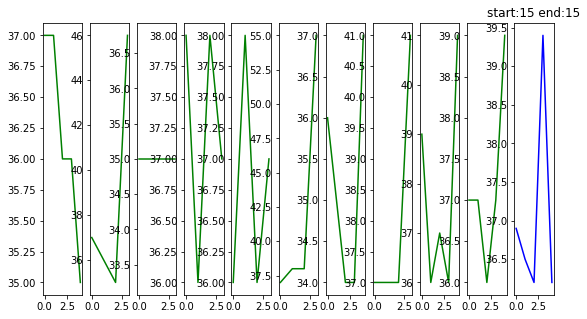

Frechet 距离: [2.3999999999999986, 9.799999999999997, 4.399999999999999, 1.3999999999999986, 1.3999999999999986, 18.799999999999997, 2.3999999999999986, 4.799999999999997, 4.799999999999997, 2.799999999999997]
FastDTW 距离: [5.400000000000006, 15.0, 10.200000000000003, 4.0, 4.0, 22.599999999999994, 10.0, 7.799999999999997, 9.700000000000003, 4.699999999999996]


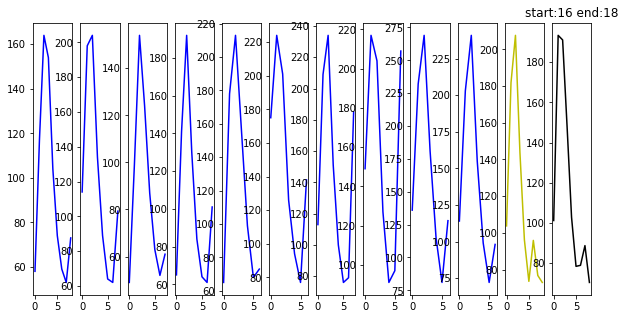

Frechet 距离: [45.8, 30.0, 54.8, 38.8, 38.8, 71.2, 112.0, 136.0, 61.400000000000006, 33.400000000000006]
FastDTW 距离: [197.5, 123.10000000000001, 239.10000000000002, 196.3, 95.3, 208.50000000000006, 207.3, 280.7, 281.3, 128.7]


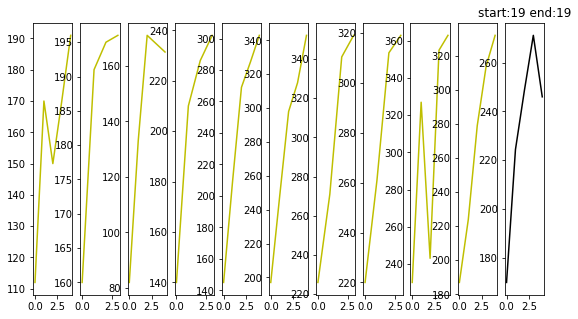

Frechet 距离: [80.19999999999999, 75.19999999999999, 100.19999999999999, 33.19999999999999, 56.0, 97.0, 106.0, 73.0, 117.0, 86.0]
FastDTW 距离: [304.2, 222.1, 440.0, 99.69999999999999, 130.50000000000003, 218.9, 255.9, 180.70000000000002, 350.5, 176.70000000000002]


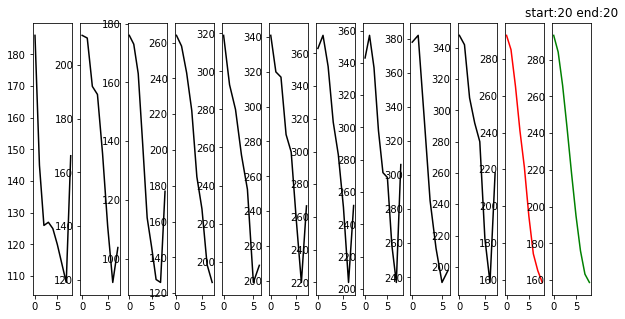

Frechet 距离: [106.89999999999998, 81.89999999999998, 116.89999999999998, 32.400000000000006, 39.599999999999994, 84.6, 108.6, 118.6, 89.10000000000002, 101.6]
FastDTW 距离: [687.4999999999999, 352.5999999999999, 731.8999999999999, 133.7, 144.80000000000004, 277.5000000000001, 503.4000000000001, 397.60000000000014, 506.9000000000001, 313.4000000000001]


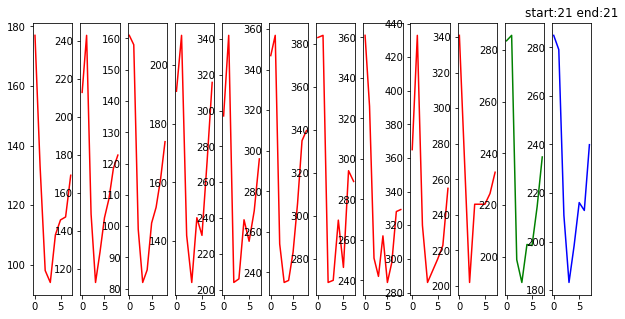

Frechet 距离: [108.69999999999999, 77.0, 124.69999999999999, 92.60000000000002, 56.30000000000001, 71.4, 99.39999999999998, 77.39999999999998, 147.3, 57.39999999999998]
FastDTW 距离: [852.0999999999999, 511.1, 980.0999999999999, 493.1, 155.1, 497.0999999999999, 691.9, 415.29999999999995, 821.9000000000001, 170.7]


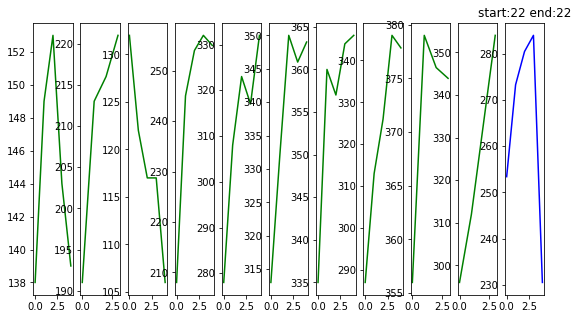

Frechet 距离: [131.0, 63.0, 152.0, 45.400000000000006, 101.5, 118.5, 133.5, 112.5, 144.5, 123.5]
FastDTW 距离: [598.7, 259.70000000000005, 727.7, 145.70000000000002, 229.29999999999998, 368.29999999999995, 457.29999999999995, 293.29999999999995, 520.3, 269.29999999999995]


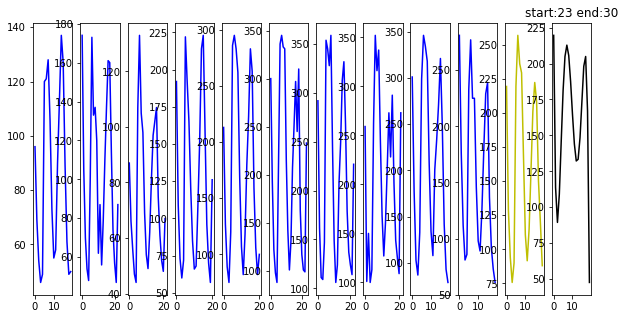

Frechet 距离: [123.5, 84.0, 132.5, 38.0, 66.30000000000001, 145.0, 139.0, 185.0, 98.6, 61.5]
FastDTW 距离: [1206.8000000000002, 817.2, 1419.1000000000001, 409.40000000000003, 444.8000000000001, 996.3, 1181.0000000000002, 1350.2000000000003, 887.8, 392.2]


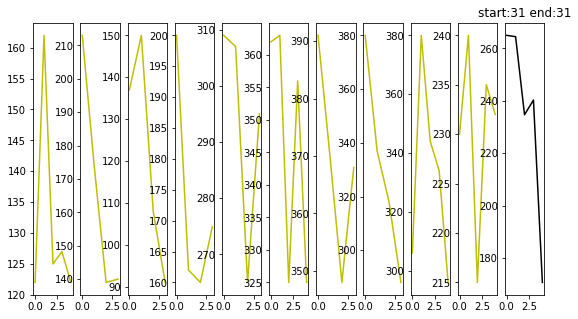

Frechet 距离: [143.0, 52.0, 128.0, 65.0, 124.30000000000001, 154.3, 197.3, 117.30000000000001, 125.30000000000001, 61.30000000000001]
FastDTW 距离: [517.2, 218.2, 539.2, 225.59999999999997, 265.8, 555.8, 649.8, 435.8, 484.8, 145.8]


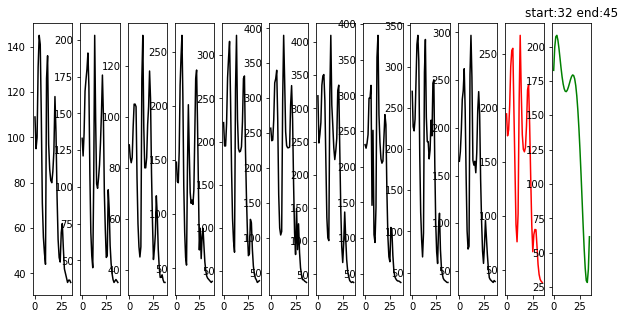

Frechet 距离: [121.89999999999998, 63.900000000000006, 134.89999999999998, 65.89999999999998, 61.099999999999994, 123.10000000000002, 143.10000000000002, 117.10000000000002, 87.1, 50.099999999999994]
FastDTW 距离: [1694.5999999999997, 1085.7000000000007, 2382.9000000000005, 741.3000000000001, 745.5000000000001, 1454.5000000000005, 1690.2000000000003, 1223.0, 1037.8999999999999, 386.49999999999994]


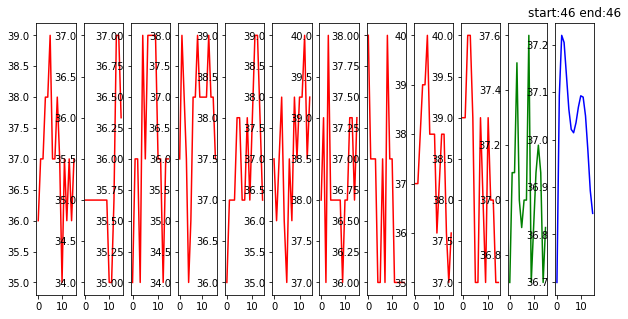

Frechet 距离: [1.7000000000000028, 2.700000000000003, 1.7000000000000028, 2.700000000000003, 1.3999999999999986, 1.7000000000000028, 2.3999999999999986, 1.2999999999999972, 2.3999999999999986, 2.3999999999999986]
FastDTW 距离: [8.300000000000011, 29.40000000000002, 12.500000000000028, 10.600000000000009, 8.699999999999996, 11.399999999999991, 18.09999999999998, 10.000000000000021, 15.200000000000003, 16.999999999999993]


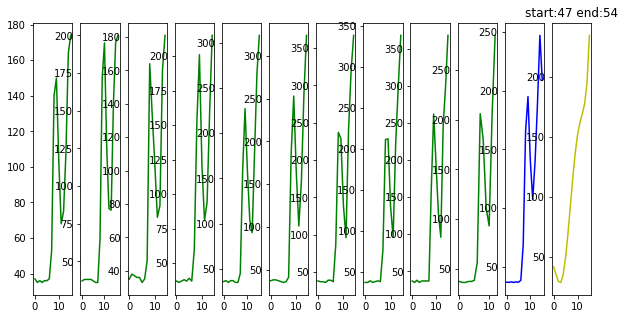

Frechet 距离: [73.19999999999999, 47.19999999999999, 66.19999999999999, 32.19999999999999, 99.1, 115.1, 158.1, 129.1, 159.1, 76.1]
FastDTW 距离: [327.6, 153.1, 263.6, 174.9, 270.70000000000005, 316.5, 466.4, 324.40000000000003, 446.6, 281.20000000000005]


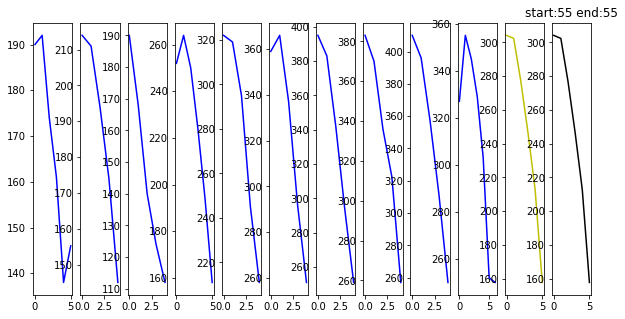

Frechet 距离: [114.19999999999999, 90.19999999999999, 114.19999999999999, 52.19999999999999, 53.19999999999999, 100.19999999999999, 93.19999999999999, 101.19999999999999, 105.80000000000001, 92.19999999999999]
FastDTW 距离: [435.99999999999994, 323.79999999999995, 500.59999999999997, 137.19999999999996, 109.00000000000003, 323.0, 362.00000000000006, 363.8, 432.80000000000007, 297.6]


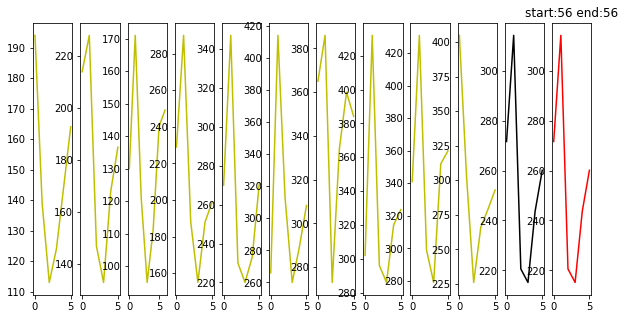

Frechet 距离: [120.10000000000002, 86.10000000000002, 143.10000000000002, 61.10000000000002, 32.89999999999998, 99.89999999999998, 99.89999999999998, 117.89999999999998, 116.89999999999998, 133.39999999999998]
FastDTW 距离: [647.3000000000001, 450.3, 821.5000000000001, 276.30000000000007, 70.29999999999998, 276.9, 541.7, 439.7, 531.8, 234.79999999999998]


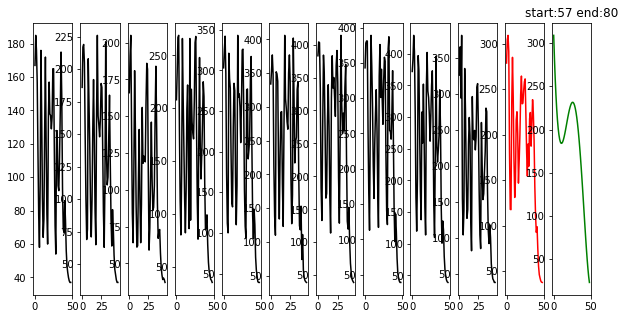

Frechet 距离: [124.30000000000001, 92.80000000000001, 112.80000000000001, 78.4, 86.4, 137.5, 149.5, 125.60000000000002, 137.5, 96.19999999999999]
FastDTW 距离: [3008.6000000000004, 1953.3, 2872.900000000001, 1397.6000000000004, 1414.1999999999998, 2329.899999999999, 2898.1999999999994, 2532.0000000000005, 2808.9, 1427.5999999999997]


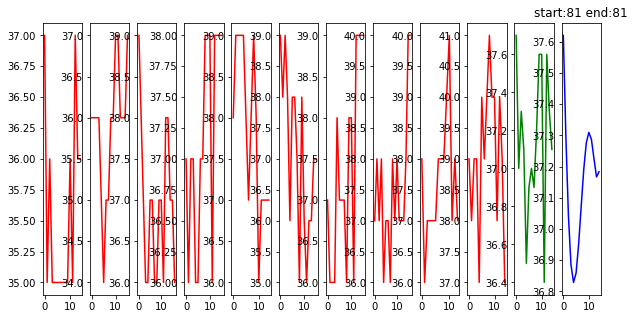

Frechet 距离: [1.3999999999999986, 2.3999999999999986, 1.2999999999999972, 0.8999999999999986, 1.2999999999999972, 1.5, 1.8999999999999986, 2.8999999999999986, 2.299999999999997, 3.299999999999997]
FastDTW 距离: [21.900000000000006, 16.900000000000006, 8.999999999999993, 7.5, 12.799999999999997, 14.899999999999991, 12.600000000000001, 12.899999999999999, 8.999999999999993, 25.69999999999998]


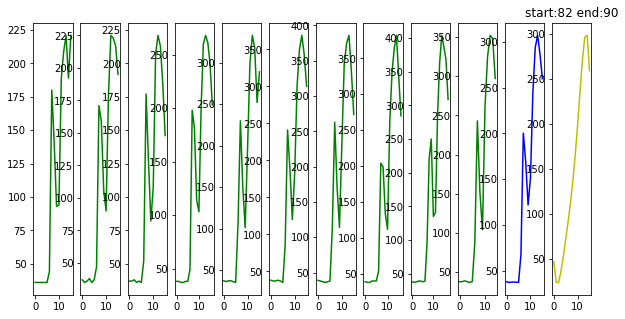

Frechet 距离: [86.39999999999998, 82.39999999999998, 114.0, 57.0, 48.900000000000006, 61.60000000000002, 78.60000000000002, 74.60000000000002, 96.60000000000002, 47.400000000000006]
FastDTW 距离: [506.0, 450.0, 561.5, 288.69999999999993, 305.80000000000007, 371.00000000000006, 425.70000000000005, 337.80000000000007, 573.5, 329.70000000000005]


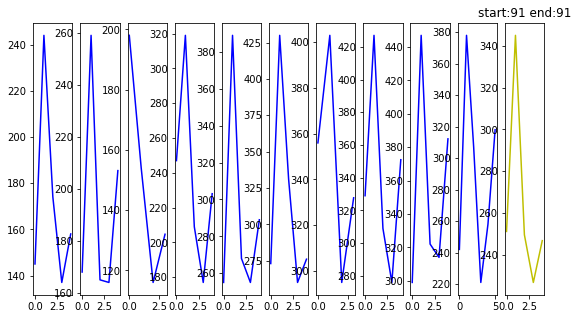

Frechet 距离: [106.19999999999999, 86.0, 147.0, 49.80000000000001, 44.0, 85.0, 104.80000000000001, 104.19999999999999, 138.2, 71.19999999999999]
FastDTW 距离: [444.20000000000005, 343.00000000000006, 521.4, 139.4, 136.6, 193.6, 361.59999999999997, 372.59999999999997, 447.59999999999997, 187.79999999999998]


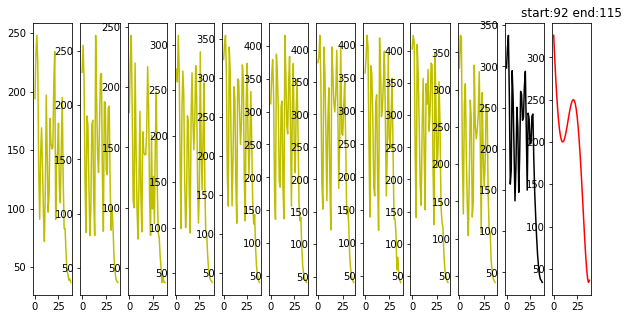

Frechet 距离: [104.10000000000002, 82.69999999999999, 119.10000000000002, 65.0, 79.1, 127.39999999999998, 128.10000000000002, 124.39999999999998, 120.10000000000002, 63.30000000000001]
FastDTW 距离: [2076.6999999999994, 2024.8999999999999, 2113.2000000000003, 1028.8999999999999, 956.3000000000001, 1707.9, 2166.5000000000005, 1906.7999999999997, 2042.6999999999998, 912.0999999999998]


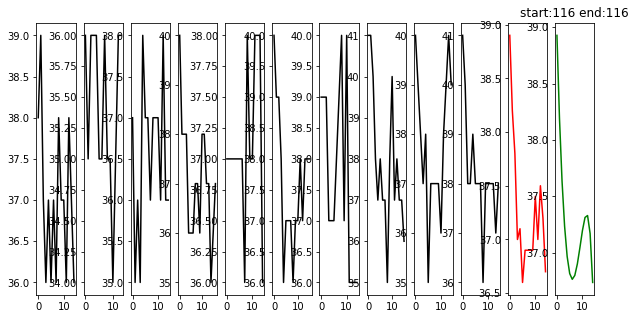

Frechet 距离: [1.0, 2.8999999999999986, 1.8999999999999986, 1.6000000000000014, 1.8999999999999986, 1.2999999999999972, 1.7999999999999972, 2.5, 2.5, 2.1000000000000014]
FastDTW 距离: [8.000000000000014, 27.0, 13.800000000000011, 10.200000000000024, 8.700000000000003, 7.000000000000014, 13.300000000000018, 14.000000000000021, 13.000000000000007, 13.900000000000013]


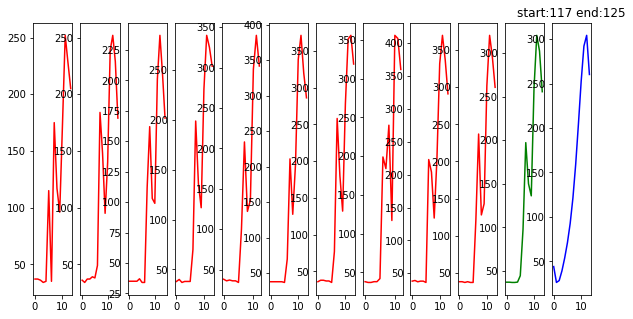

Frechet 距离: [68.19999999999999, 76.6, 86.6, 35.19999999999999, 46.400000000000006, 64.80000000000001, 76.4, 96.30000000000001, 91.80000000000001, 49.80000000000001]
FastDTW 距离: [427.29999999999995, 359.20000000000005, 478.79999999999995, 174.39999999999998, 160.90000000000003, 284.70000000000005, 337.9, 365.20000000000005, 438.1, 261.80000000000007]


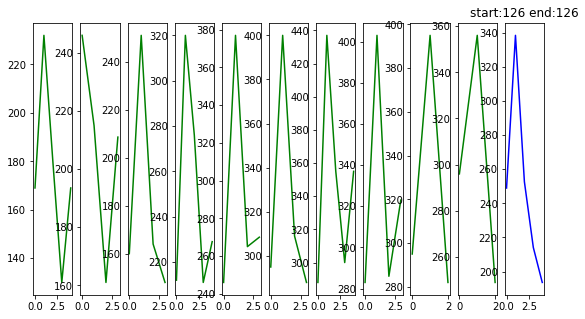

Frechet 距离: [106.60000000000002, 92.60000000000002, 89.0, 37.0, 76.4, 94.4, 161.4, 129.4, 88.4, 55.400000000000006]
FastDTW 距离: [327.0, 153.20000000000002, 274.0, 117.40000000000003, 181.0, 332.0, 448.4, 333.0, 288.0, 158.39999999999998]


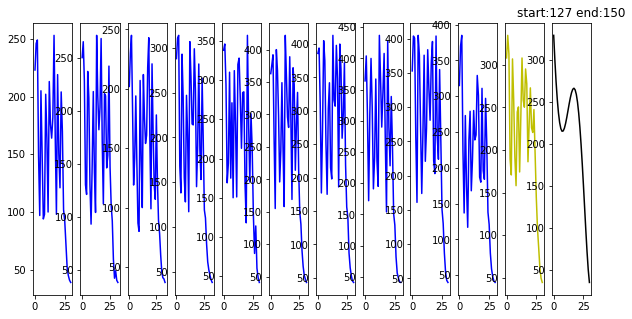

Frechet 距离: [85.69999999999999, 70.0, 106.19999999999999, 63.5, 109.5, 113.89999999999998, 104.89999999999998, 130.0, 105.10000000000002, 72.19999999999999]
FastDTW 距离: [1918.8999999999994, 1349.3999999999996, 2009.1000000000006, 723.0999999999999, 913.3999999999999, 2003.8999999999996, 1768.9999999999998, 1450.9000000000005, 1723.9, 742.1999999999999]


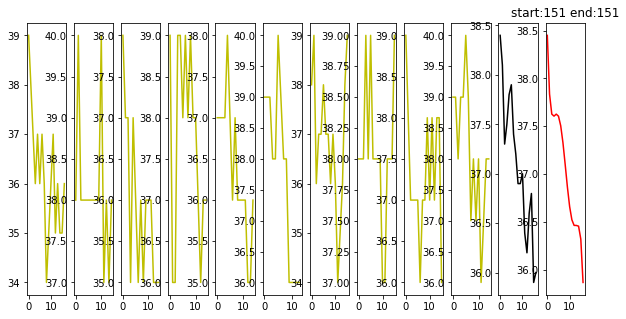

Frechet 距离: [1.8999999999999986, 2.0, 1.0, 1.5, 1.3999999999999986, 1.6000000000000014, 3.0, 3.0, 1.0, 2.0]
FastDTW 距离: [11.700000000000017, 12.500000000000014, 10.200000000000017, 13.300000000000018, 7.70000000000001, 12.600000000000009, 13.600000000000001, 13.900000000000013, 9.79999999999999, 13.500000000000014]


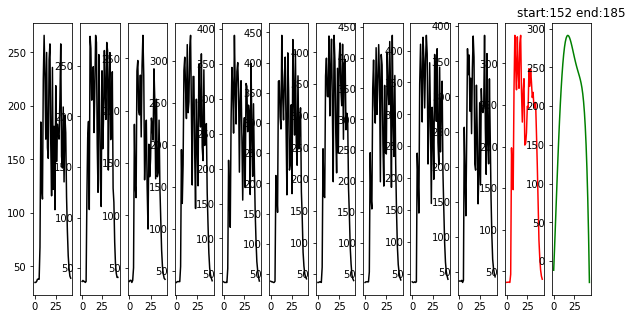

Frechet 距离: [79.80000000000001, 90.4, 91.19999999999999, 77.80000000000001, 83.69999999999999, 113.60000000000002, 95.19999999999999, 111.60000000000002, 108.19999999999999, 93.5]
FastDTW 距离: [1551.0000000000002, 1422.2000000000003, 1642.6, 1094.1000000000001, 1051.1, 1726.6000000000001, 2027.6999999999996, 1845.1000000000001, 1904.3000000000004, 1308.2]


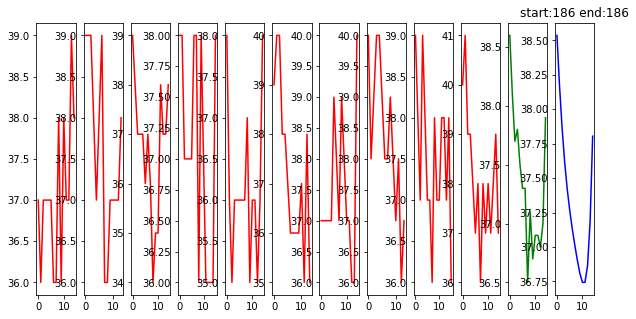

Frechet 距离: [1.6000000000000014, 1.5, 2.5, 1.0, 1.5, 2.8999999999999986, 2.1000000000000014, 1.3999999999999986, 1.8999999999999986, 2.3999999999999986]
FastDTW 距离: [11.500000000000007, 6.6000000000000085, 11.000000000000014, 9.399999999999991, 14.100000000000009, 12.699999999999996, 14.100000000000023, 10.899999999999999, 10.70000000000001, 11.899999999999999]


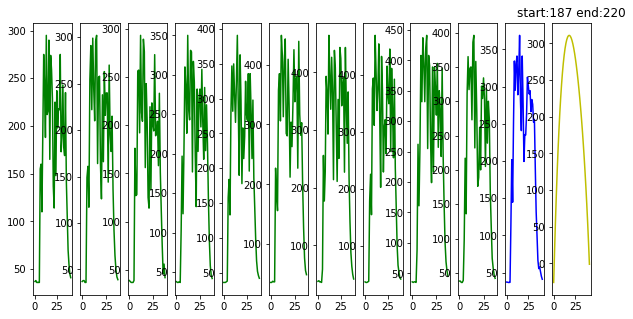

Frechet 距离: [84.4, 73.4, 82.4, 66.4, 70.39999999999998, 107.80000000000001, 122.80000000000001, 111.19999999999999, 94.19999999999999, 61.39999999999998]
FastDTW 距离: [1444.4000000000005, 1301.4999999999998, 1345.900000000001, 975.3000000000002, 749.5999999999999, 1600.7000000000005, 1887.9999999999998, 1816.4000000000008, 1550.9000000000008, 825.3]


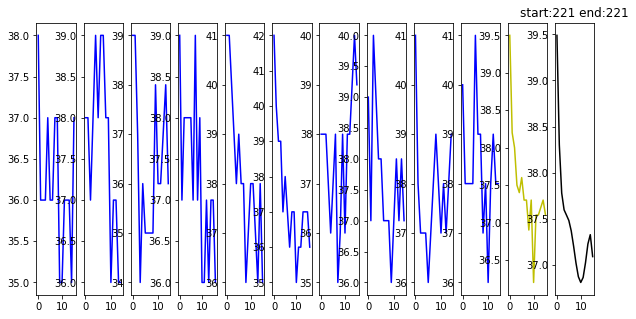

Frechet 距离: [1.5, 1.5, 2.200000000000003, 1.1000000000000014, 1.5, 2.5, 2.700000000000003, 1.7999999999999972, 1.8999999999999986, 1.7000000000000028]
FastDTW 距离: [14.000000000000014, 12.799999999999997, 18.60000000000001, 8.600000000000009, 12.699999999999996, 11.399999999999999, 16.70000000000001, 8.900000000000006, 11.700000000000003, 14.0]


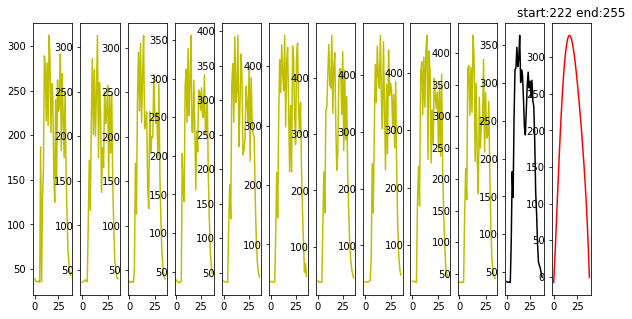

Frechet 距离: [97.80000000000001, 85.80000000000001, 103.80000000000001, 75.19999999999999, 67.39999999999998, 105.10000000000002, 126.69999999999999, 122.10000000000002, 113.69999999999999, 86.69999999999999]
FastDTW 距离: [1427.1, 1261.6000000000004, 1112.5999999999997, 908.9000000000001, 890.6000000000001, 1579.3000000000002, 1716.9, 1545.0, 1787.5000000000005, 1169.0999999999997]


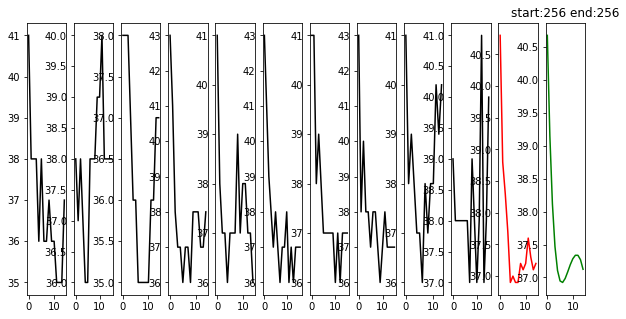

Frechet 距离: [1.8999999999999986, 2.799999999999997, 2.799999999999997, 2.200000000000003, 1.3999999999999986, 2.200000000000003, 0.8999999999999986, 2.200000000000003, 2.799999999999997, 2.799999999999997]
FastDTW 距离: [14.799999999999997, 16.899999999999984, 19.19999999999999, 8.799999999999997, 7.399999999999999, 9.400000000000013, 5.70000000000001, 8.800000000000004, 12.199999999999996, 14.699999999999982]


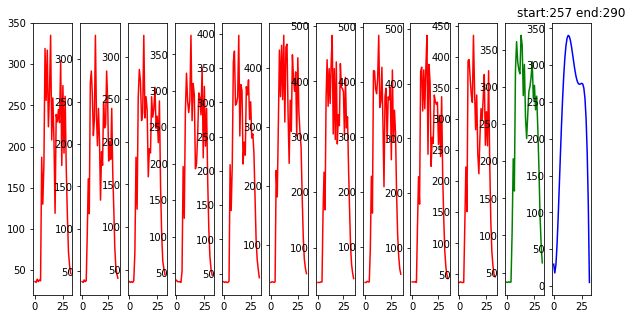

Frechet 距离: [111.6, 94.0, 81.80000000000001, 61.19999999999999, 65.3, 88.0, 113.60000000000002, 115.60000000000002, 118.60000000000002, 72.0]
FastDTW 距离: [1005.0999999999998, 1300.6000000000006, 1278.5000000000002, 814.3000000000001, 712.0000000000001, 1221.6999999999998, 1448.3, 1347.9999999999995, 1250.3, 626.7000000000003]


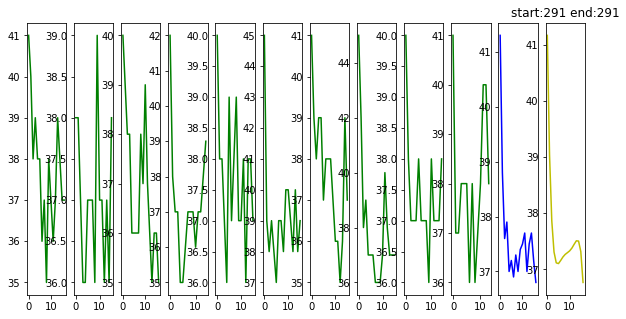

Frechet 距离: [1.8999999999999986, 3.299999999999997, 1.7999999999999972, 2.200000000000003, 1.5, 3.700000000000003, 1.8999999999999986, 3.700000000000003, 1.2999999999999972, 2.1000000000000014]
FastDTW 距离: [11.0, 14.499999999999993, 16.29999999999999, 13.599999999999994, 11.899999999999999, 21.799999999999997, 12.000000000000014, 14.700000000000003, 8.400000000000006, 14.399999999999991]


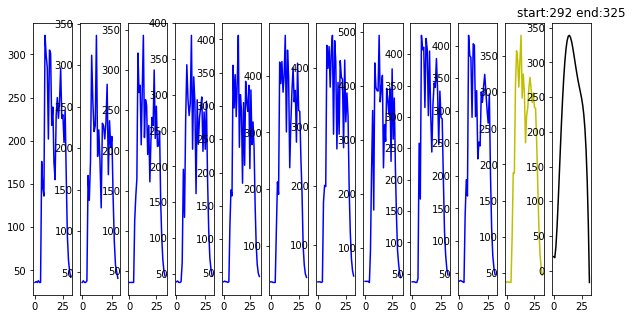

Frechet 距离: [75.0, 102.0, 69.6, 68.10000000000002, 69.19999999999999, 116.10000000000002, 108.89999999999998, 137.2, 122.10000000000002, 108.10000000000002]
FastDTW 距离: [875.9000000000001, 1193.8, 974.7999999999998, 689.0999999999998, 710.8999999999999, 1312.0000000000005, 1449.0, 1390.5, 1033.3000000000002, 664.6]


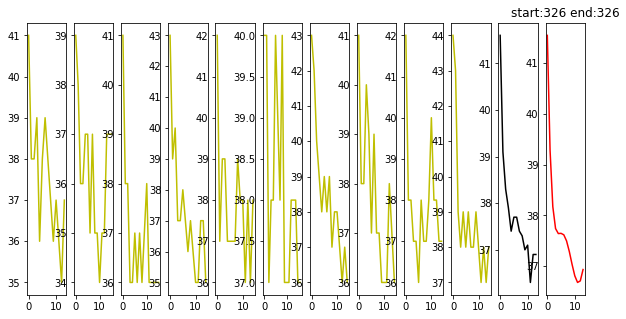

Frechet 距离: [1.3999999999999986, 2.6000000000000014, 1.1000000000000014, 1.8999999999999986, 2.1000000000000014, 1.7000000000000028, 1.3999999999999986, 1.1000000000000014, 2.1000000000000014, 2.3999999999999986]
FastDTW 距离: [9.899999999999991, 16.899999999999984, 11.59999999999998, 11.899999999999984, 12.499999999999993, 12.699999999999996, 8.099999999999987, 10.999999999999993, 10.29999999999999, 10.999999999999993]


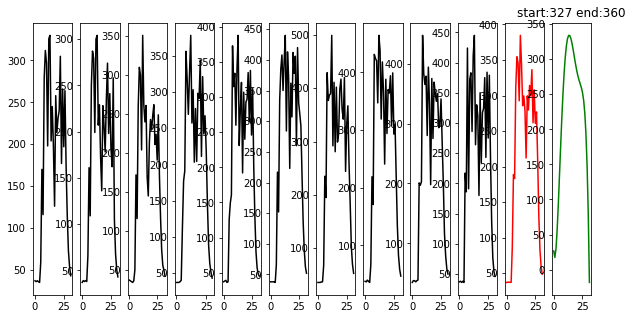

Frechet 距离: [86.1, 93.60000000000002, 74.69999999999999, 58.69999999999999, 62.39999999999998, 83.60000000000002, 115.60000000000002, 120.39999999999998, 107.60000000000002, 113.39999999999998]
FastDTW 距离: [1191.2000000000003, 1194.8, 1114.2999999999997, 526.9999999999999, 633.1000000000001, 1066.3000000000002, 1326.1000000000004, 1243.0, 803.5, 1049.1999999999998]


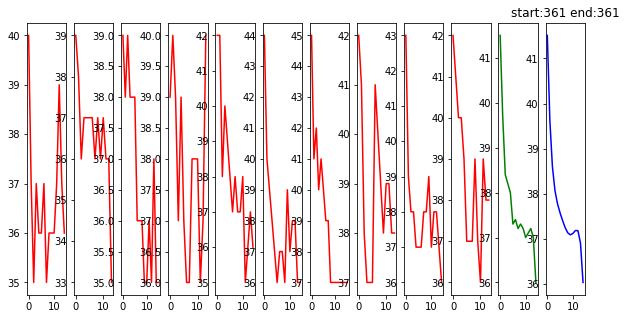

Frechet 距离: [2.0, 3.0, 2.5, 4.0, 1.7000000000000028, 2.5, 3.5, 2.6000000000000014, 1.5, 2.0]
FastDTW 距离: [17.699999999999996, 11.500000000000007, 18.1, 16.000000000000007, 8.70000000000001, 10.699999999999996, 11.499999999999993, 19.199999999999996, 8.500000000000007, 12.699999999999996]


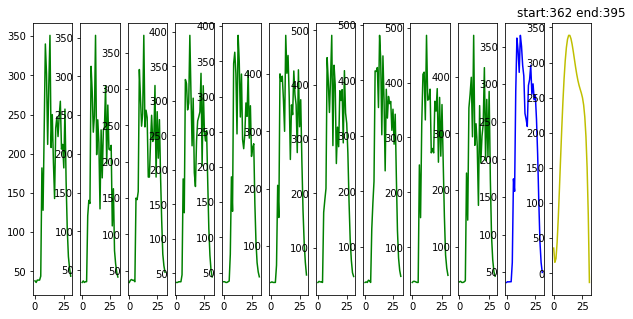

Frechet 距离: [66.30000000000001, 81.19999999999999, 64.80000000000001, 68.80000000000001, 61.89999999999998, 109.0, 126.0, 116.0, 121.0, 108.0]
FastDTW 距离: [933.5000000000003, 1177.9999999999998, 919.3999999999999, 798.1999999999998, 559.0000000000001, 1074.9, 1296.8999999999999, 1254.0999999999997, 1028.4999999999998, 1022.9000000000001]


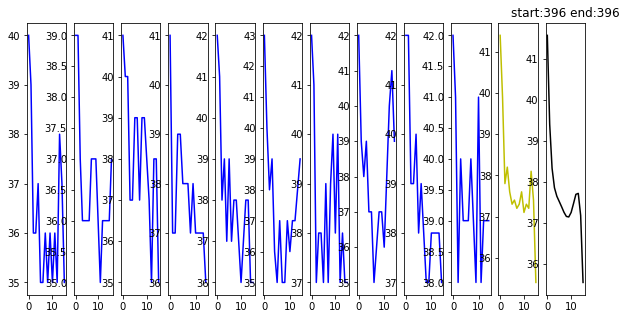

Frechet 距离: [2.1000000000000014, 2.3999999999999986, 2.1000000000000014, 1.1000000000000014, 1.2000000000000028, 3.6000000000000014, 1.7999999999999972, 3.6000000000000014, 1.6000000000000014, 3.6000000000000014]
FastDTW 距离: [22.6, 18.800000000000004, 12.499999999999986, 9.79999999999999, 10.000000000000007, 18.000000000000007, 15.399999999999999, 18.700000000000003, 9.300000000000004, 23.699999999999996]


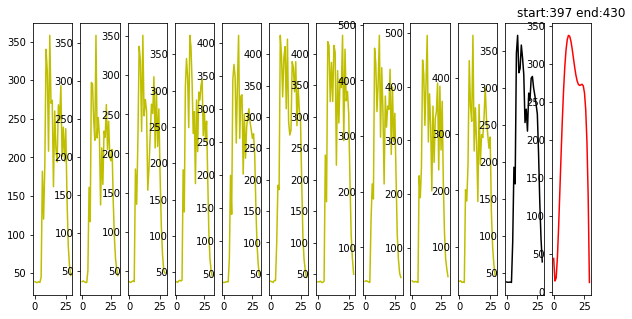

Frechet 距离: [81.69999999999999, 74.30000000000001, 86.69999999999999, 69.4, 72.19999999999999, 83.69999999999999, 97.19999999999999, 111.69999999999999, 125.30000000000001, 105.30000000000001]
FastDTW 距离: [793.8, 1149.1000000000001, 1041.2, 676.9999999999998, 528.9999999999998, 897.6999999999998, 1190.1, 1292.1999999999996, 1354.1000000000001, 899.5]


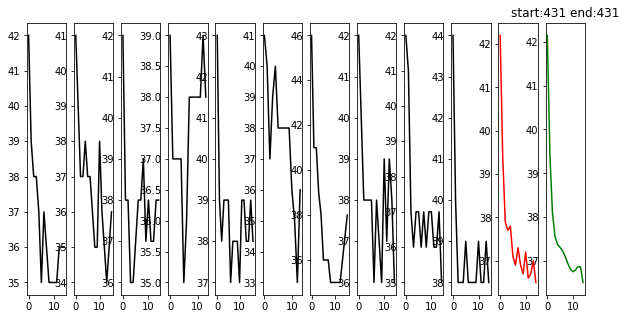

Frechet 距离: [1.5, 2.5, 1.7000000000000028, 3.200000000000003, 1.5, 3.5, 3.799999999999997, 1.7000000000000028, 1.6000000000000014, 1.7999999999999972]
FastDTW 距离: [12.500000000000014, 15.900000000000013, 12.100000000000023, 17.599999999999994, 15.999999999999979, 18.100000000000016, 21.70000000000001, 10.400000000000013, 10.400000000000006, 17.099999999999994]


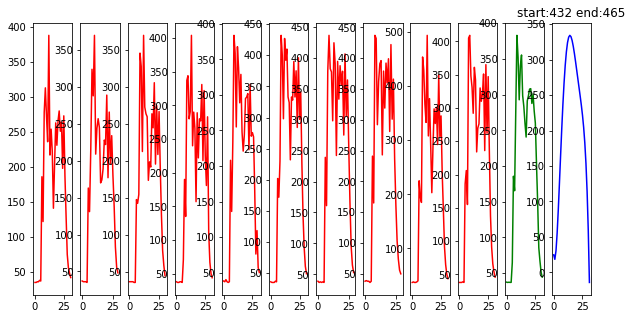

Frechet 距离: [79.60000000000002, 74.60000000000002, 77.19999999999999, 83.6, 42.10000000000002, 74.5, 101.89999999999998, 111.10000000000002, 110.89999999999998, 121.10000000000002]
FastDTW 距离: [1093.9, 1021.3000000000002, 827.1000000000001, 880.4000000000001, 556.0, 989.1000000000001, 963.6999999999998, 1204.3000000000002, 1066.3, 773.3000000000002]


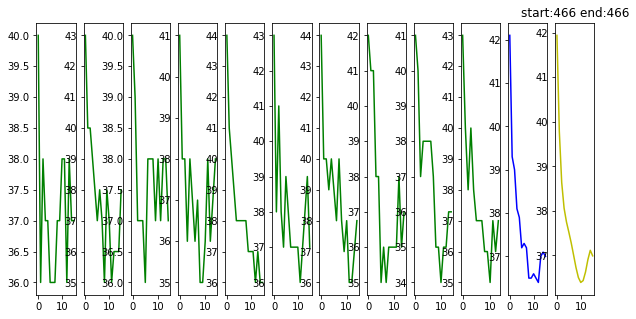

Frechet 距离: [2.1000000000000014, 1.5, 2.1000000000000014, 1.3999999999999986, 1.8999999999999986, 1.7000000000000028, 1.8999999999999986, 1.5, 2.3999999999999986, 1.3999999999999986]
FastDTW 距离: [13.000000000000007, 12.000000000000014, 12.899999999999991, 13.300000000000011, 9.300000000000011, 12.199999999999996, 11.300000000000004, 13.700000000000003, 16.500000000000014, 8.100000000000009]


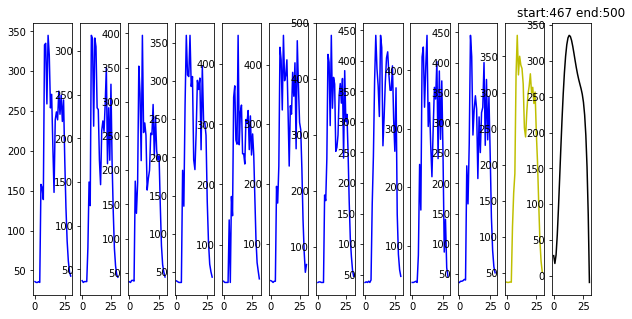

Frechet 距离: [70.9, 76.9, 88.30000000000001, 69.1, 76.9, 95.39999999999998, 98.69999999999999, 95.6, 97.60000000000002, 74.0]
FastDTW 距离: [707.8000000000001, 901.0000000000001, 1015.6, 673.5999999999999, 756.9, 1145.5999999999997, 1311.4999999999998, 1152.1000000000001, 1154.1, 841.7999999999998]


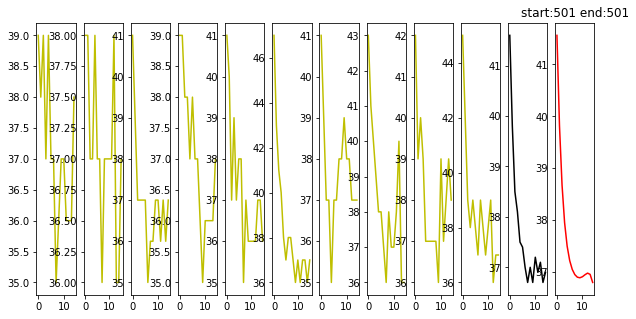

Frechet 距离: [2.6000000000000014, 3.6000000000000014, 1.7000000000000028, 2.6000000000000014, 1.7000000000000028, 5.399999999999999, 1.7999999999999972, 2.1000000000000014, 1.5, 3.3999999999999986]
FastDTW 距离: [13.200000000000017, 11.20000000000001, 8.700000000000017, 11.40000000000002, 11.40000000000002, 12.40000000000002, 12.0, 11.100000000000001, 10.899999999999991, 12.700000000000003]


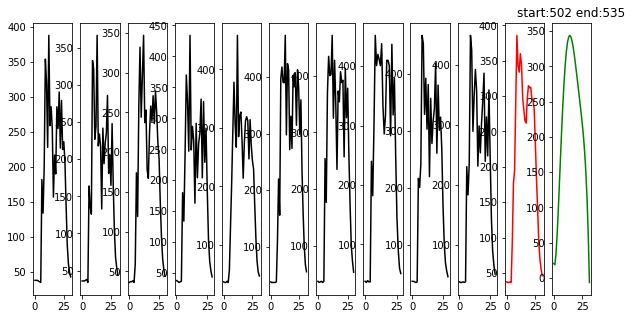

Frechet 距离: [77.0, 101.0, 67.0, 97.0, 85.0, 105.0, 98.30000000000001, 77.10000000000002, 103.30000000000001, 72.89999999999998]
FastDTW 距离: [886.4999999999999, 1186.1, 810.8000000000001, 1006.1, 663.6, 1220.1000000000001, 1392.9999999999998, 1111.6000000000006, 1004.9999999999999, 877.9]


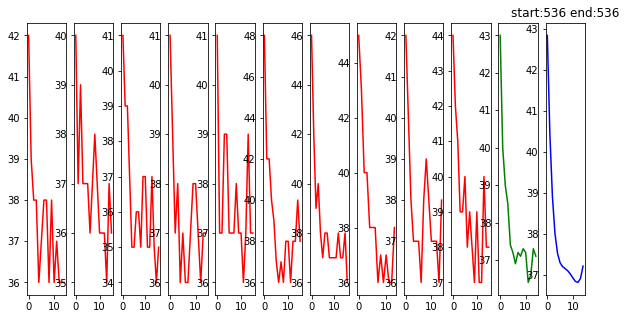

Frechet 距离: [1.1000000000000014, 3.0, 2.3999999999999986, 2.0, 2.0, 5.0, 3.0, 2.0, 1.6000000000000014, 1.6000000000000014]
FastDTW 距离: [11.999999999999993, 12.500000000000007, 22.599999999999994, 10.600000000000001, 12.300000000000004, 17.80000000000001, 12.40000000000002, 9.800000000000004, 10.699999999999996, 13.40000000000002]


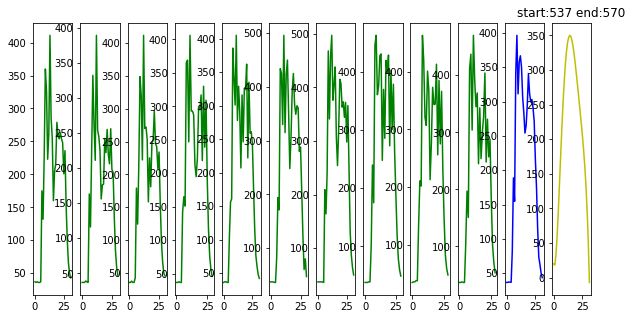

Frechet 距离: [73.30000000000001, 84.19999999999999, 80.4, 64.30000000000001, 68.69999999999999, 99.5, 100.5, 104.5, 121.5, 92.5]
FastDTW 距离: [962.1, 1107.3999999999999, 917.4000000000001, 796.6999999999998, 700.6000000000001, 990.9999999999998, 1104.7, 1032.6000000000001, 969.2, 755.3]


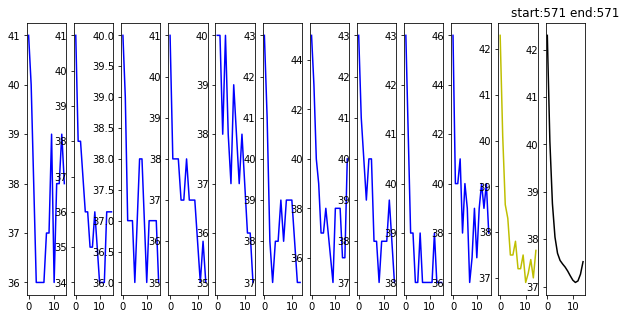

Frechet 距离: [1.5, 2.8999999999999986, 2.299999999999997, 2.6000000000000014, 2.6000000000000014, 1.2000000000000028, 2.700000000000003, 1.2000000000000028, 1.1000000000000014, 3.700000000000003]
FastDTW 距离: [13.700000000000003, 26.499999999999993, 10.800000000000004, 12.400000000000006, 13.000000000000007, 10.500000000000014, 15.90000000000002, 9.400000000000006, 11.999999999999993, 20.600000000000016]


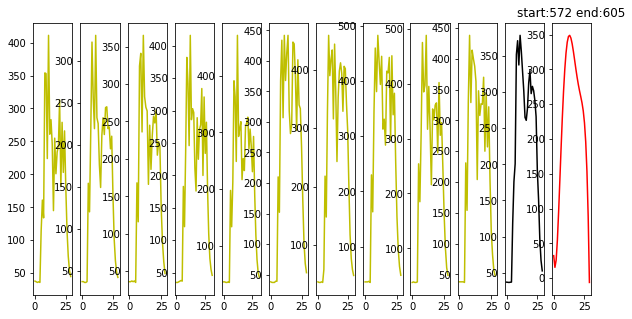

Frechet 距离: [115.89999999999998, 56.5, 84.80000000000001, 87.19999999999999, 92.5, 79.8, 82.30000000000001, 104.5, 109.5, 81.8]
FastDTW 距离: [1067.4999999999998, 940.6000000000005, 933.1999999999998, 939.1999999999999, 755.6999999999999, 1015.0, 1207.1, 1276.9, 1055.5999999999995, 969.0]


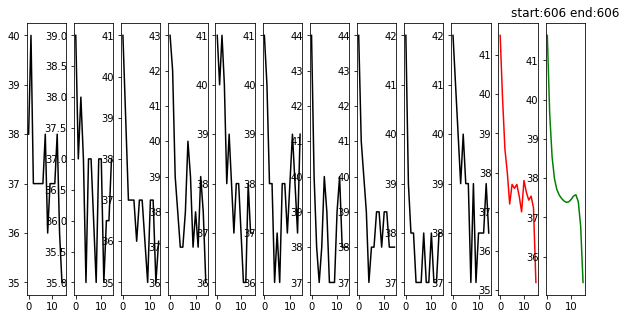

Frechet 距离: [3.5, 2.5, 1.7999999999999972, 1.6000000000000014, 1.7999999999999972, 3.799999999999997, 2.799999999999997, 2.799999999999997, 2.799999999999997, 2.799999999999997]
FastDTW 距离: [12.700000000000017, 17.299999999999983, 12.5, 12.399999999999991, 10.29999999999999, 11.700000000000003, 16.5, 17.0, 8.899999999999991, 13.400000000000006]


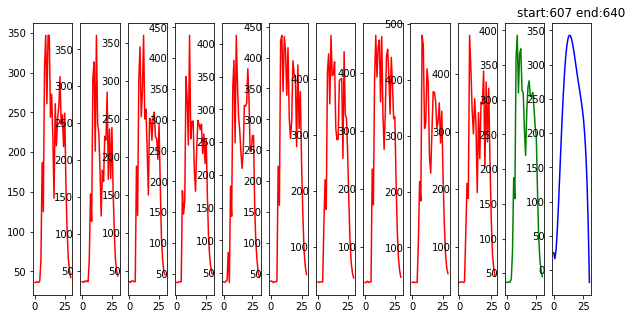

Frechet 距离: [77.80000000000001, 97.80000000000001, 69.80000000000001, 70.10000000000002, 60.80000000000001, 66.19999999999999, 90.19999999999999, 101.19999999999999, 119.19999999999999, 106.19999999999999]
FastDTW 距离: [910.0000000000001, 1316.5000000000002, 891.2000000000002, 647.4, 589.2999999999998, 964.1, 1118.5, 1244.2, 883.1, 920.9999999999999]


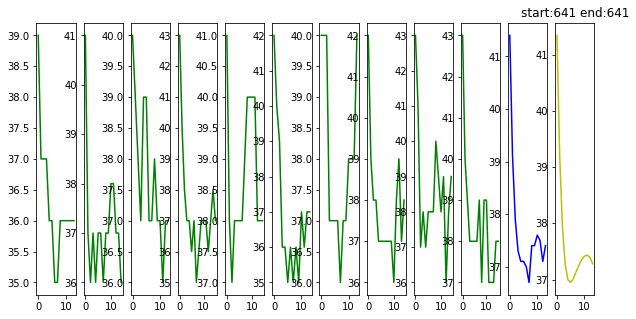

Frechet 距离: [2.3999999999999986, 1.8999999999999986, 1.3999999999999986, 1.7000000000000028, 2.1000000000000014, 1.7000000000000028, 2.6000000000000014, 1.3999999999999986, 2.1000000000000014, 1.6000000000000014]
FastDTW 距离: [17.10000000000001, 9.699999999999996, 8.899999999999999, 10.0, 17.39999999999999, 15.600000000000009, 10.499999999999993, 5.900000000000013, 18.20000000000001, 11.200000000000003]


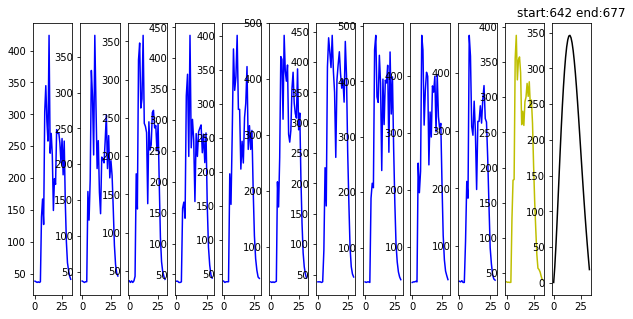

Frechet 距离: [89.30000000000001, 80.60000000000002, 64.6, 89.4, 72.80000000000001, 90.19999999999999, 81.60000000000002, 102.10000000000002, 117.10000000000002, 110.10000000000002]
FastDTW 距离: [1044.7999999999995, 905.6999999999999, 955.0999999999997, 827.4999999999998, 721.7999999999998, 1157.5, 1197.1, 1383.2999999999997, 1082.0000000000005, 707.4999999999999]


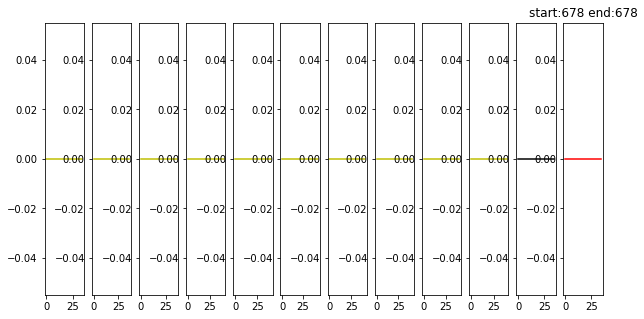

Frechet 距离: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
FastDTW 距离: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


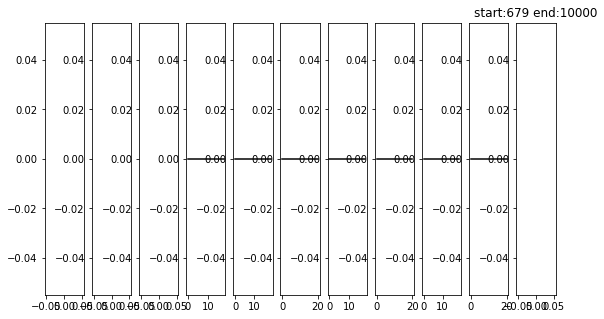

Frechet 距离: [inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]
FastDTW 距离: [inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]


In [8]:
devno = 0
colors = ['r','g','b','y','k']
alllen = len(refdata[1])
for templen in range(alllen):
    yst = list(refdata[1].iloc[templen]['loads'])
    ymean = list(refdata[1].iloc[templen]['loads'])
    frechetSim = []
    dtwSim = []
#     pearsonrSim = []
#     spearmanrSim = []
#     kendalltauSim = []
    for num in refdata:
        if num == 1:
            continue
        y = list(refdata[num].iloc[templen]['loads'])
        for i in range(len(ymean)):
            if i < len(y):
                ymean[i] += y[i]
            else:
                ymean[i] += yst[i]
    ymean = [yt / 10 for yt in ymean]
    for num in refdata:
        fig = plt.figure(devno + 1)
        fig.set_size_inches(10,5,forward=True)
        y = list(refdata[num].iloc[templen]['loads'])
        x = range(len(y))
        if len(y) > 1 and len(ymean) > 1:
            frechetSim.append(getsimilarity(ymean,y))
        else:
            frechetSim.append(float("inf"))
        if len(y) > 1 and len(ymean) > 1:
            distance, path = fastdtw(np.array(ymean), np.array(y))
            dtwSim.append(distance)
        else:
            dtwSim.append(float("inf"))
#         pearsonrSim.append(pearsonr(yst,y)[0])
#         spearmanrSim.append(spearmanr(yst,y)[0])
#         kendalltauSim.append(kendalltau(yst,y)[0])
        ax = fig.add_subplot(1,12,num)
        line1 = ax.plot(x,y,color = colors[devno % 5])
    x = range(len(ymean))
    ax2 = fig.add_subplot(1,12,11)
    line2 = ax2.plot(x,ymean,color = colors[(devno + 1) % 5])
    if len(ymean) > 5:
        z1 = np.polyfit(x,ymean,5)
        yvals = np.polyval(z1,x)
        ax = fig.add_subplot(1,12,12)
        line1 = ax.plot(x,yvals,color = colors[(devno + 2) % 5])
    tempstr = "start:"+str(refdata[1].iloc[templen]['start'])+" end:"+str(refdata[1].iloc[templen]['end'])
    plt.title(tempstr)
    #plt.savefig(str(devno + 1)+".png")
    plt.show()
    print("Frechet 距离:",frechetSim)
    print("FastDTW 距离:",dtwSim)
#     print("pearsonrSim:",pearsonrSim)
#     print("spearmanrSim:",spearmanrSim)
#     print("kendalltauSim:",kendalltauSim)
    devno += 1

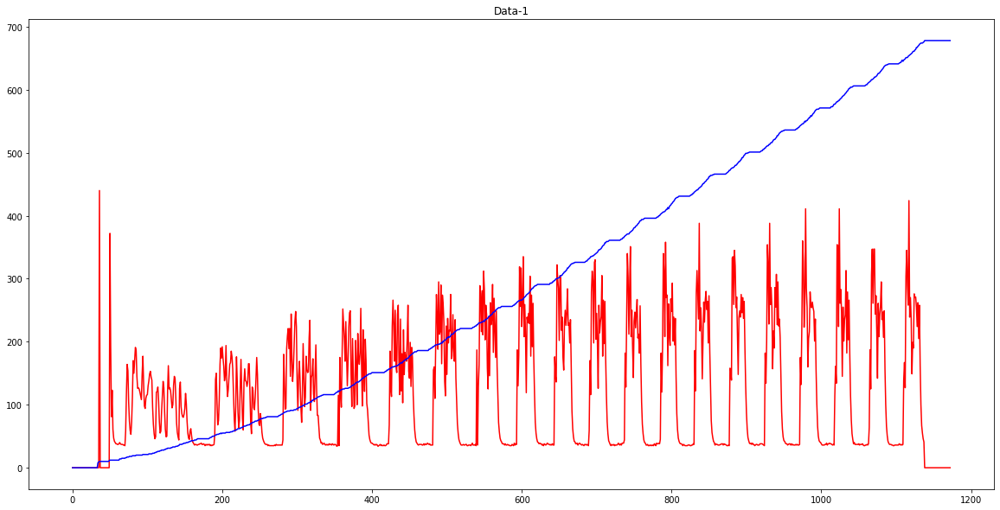

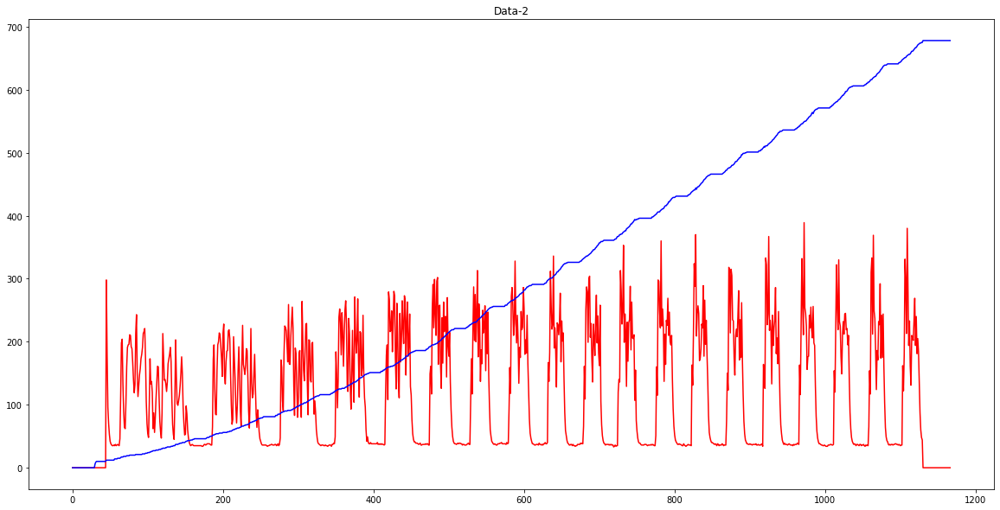

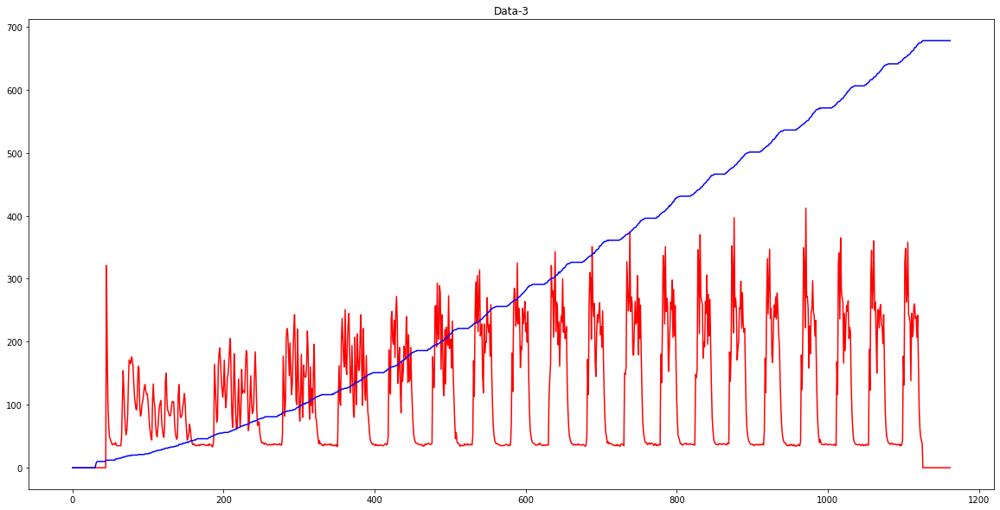

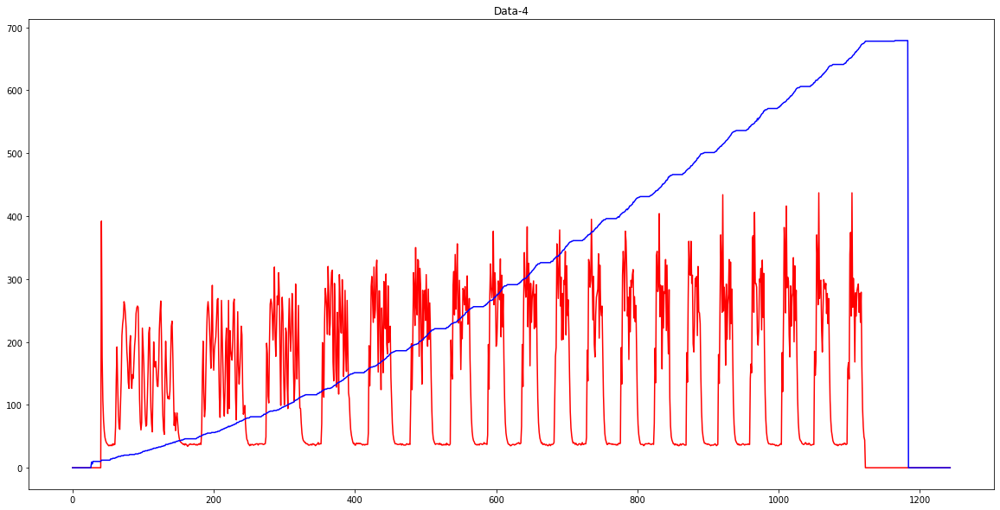

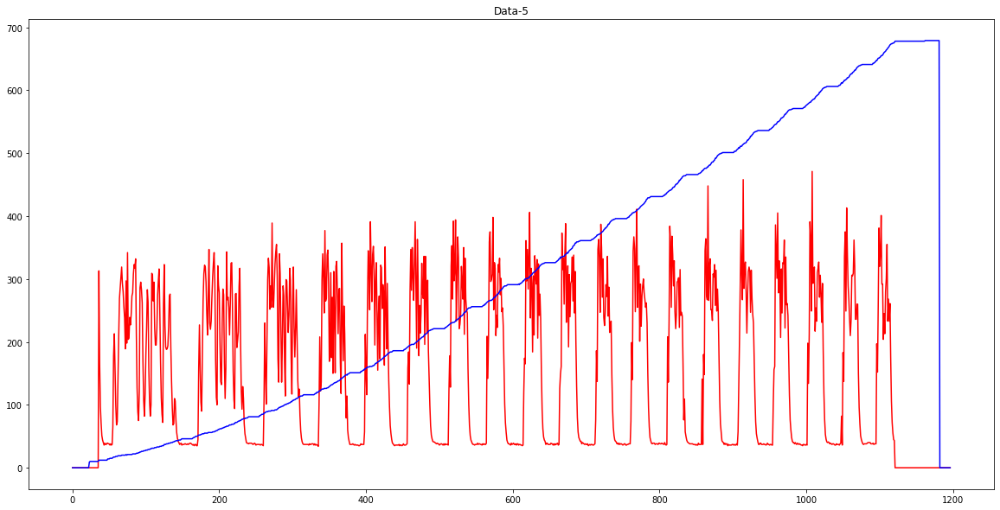

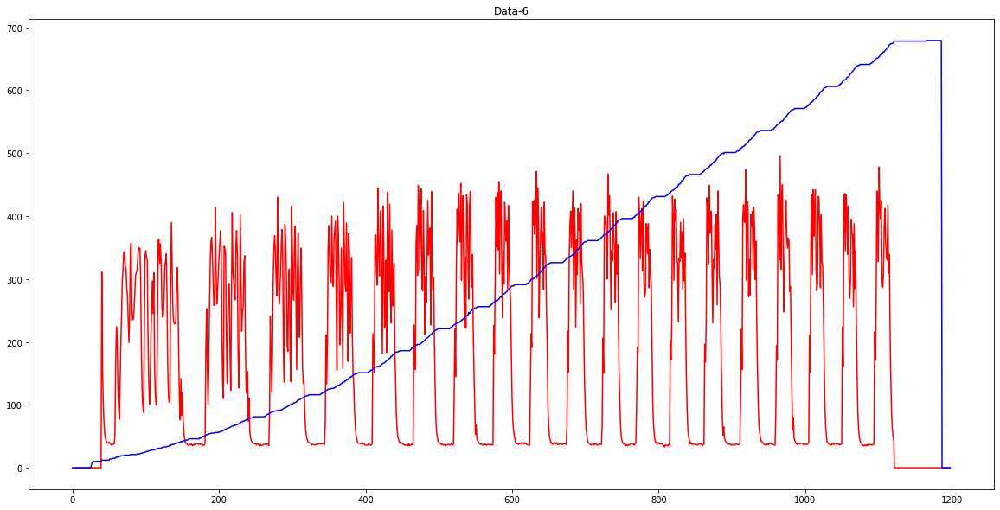

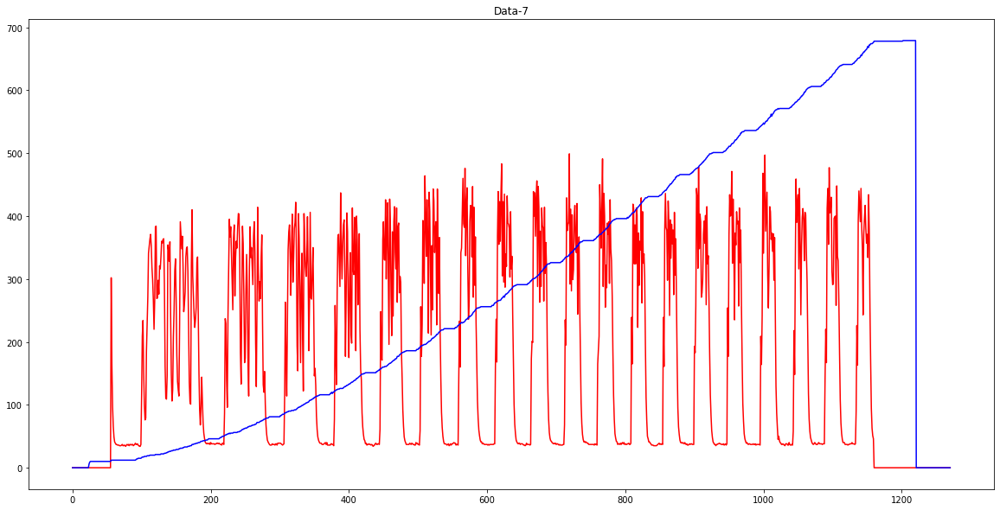

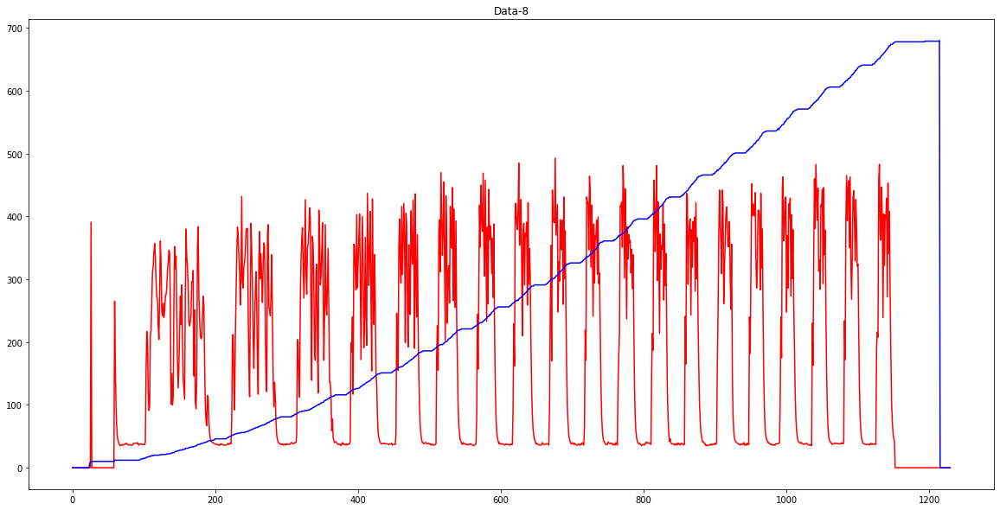

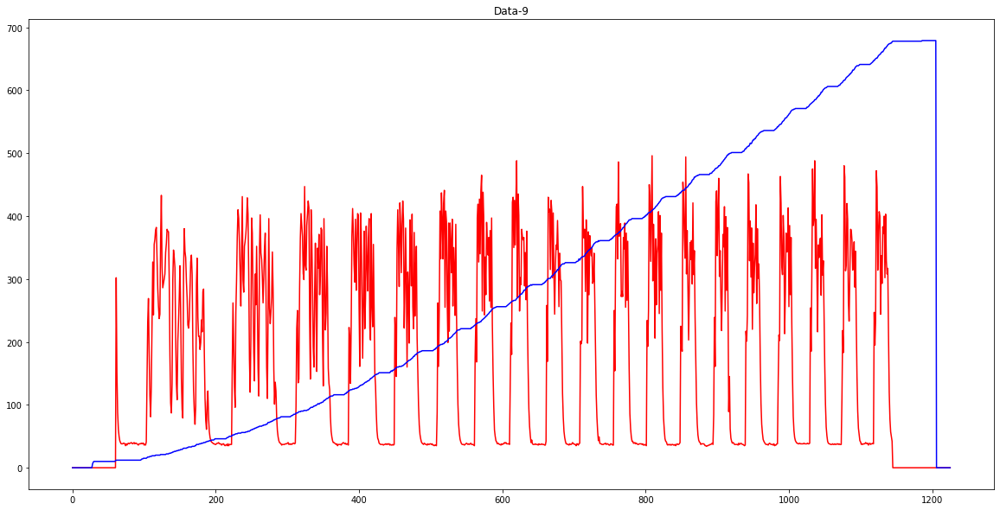

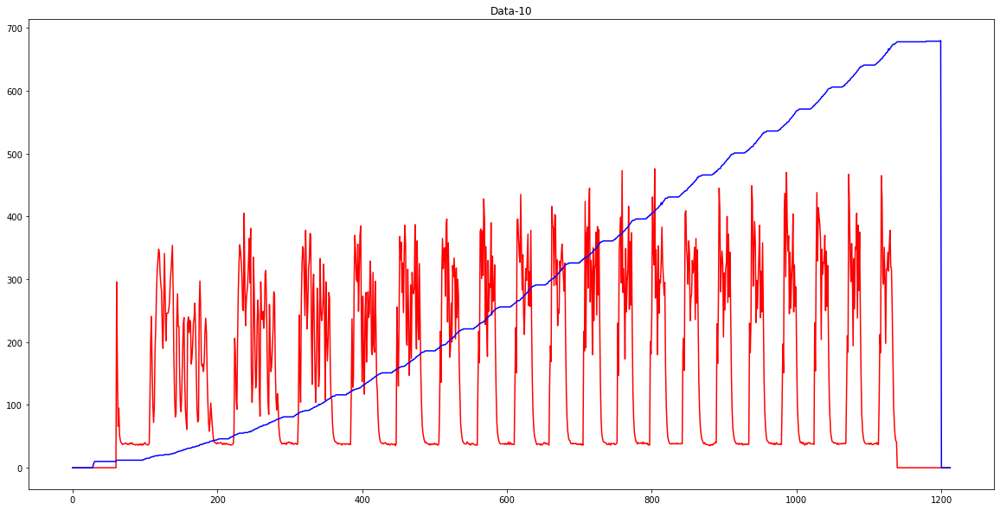

In [29]:
devno = 0
colors = ['r','g','b','y','k']
for devid,tempdf in alldata2.items():
    fig = plt.figure(devno + 1)
    fig.set_size_inches(20,10,forward=True)
    x = range(len(alldata2[devid]['load']))
    y1 = list(alldata2[devid]['load'])
    line1 = plt.plot(x,y1)
    plt.setp(line1,color = colors[0])
#     y2 = list(alldata2[devid]['feed'])
#     line2 = plt.plot(x,y2)
#     plt.setp(line2,color = colors[1])
    y3 = list(alldata2[devid]['line'])
    line3 = plt.plot(x,y3)
    plt.setp(line3,color = colors[2])
    plt.title("Data-"+str(devid))
    plt.show()
    devno += 1

In [3]:
callen3 = [0,0,0,0,0,0,0,0,0,0,0]
linetemp = {}
alllen = 0
alllinedict = {}
newlostline = True
for num in alldata:
    linetemp[num] = []
    alllinedict[num] = {}
for num in alldata:
    for line in alldata[num] :
        if len(alldata[num][line]['load']) >= 5:
            callen3[num]+=1
            linetemp[num].append(line)
            alllen += 1
            alllinedict[num][alllen] = [line]
            newlostline = True
        else:
            if newlostline:
                alllen += 1
                alllinedict[num][alllen] = [line]
                newlostline = False
            else:
                alllinedict[num][alllen].append(line)
print(callen3[1])
print(linetemp[1])
print(alllinedict[1])

32
[0, 10, 12, 15, 19, 20, 21, 22, 31, 46, 55, 56, 81, 91, 116, 126, 151, 186, 221, 256, 291, 326, 361, 396, 431, 466, 501, 536, 571, 606, 641, 678]
{1: [0], 2: [8, 9], 3: [10], 4: [11], 5: [12], 6: [14], 7: [15], 8: [16, 17, 18], 9: [19], 10: [20], 11: [21], 12: [22], 13: [23, 24, 25, 26, 27, 28, 29, 30], 14: [31], 15: [32, 33, 34, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45], 16: [46], 17: [47, 48, 49, 50, 51, 52, 53, 54], 18: [55], 19: [56], 20: [57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 74, 75, 76, 77, 78, 79, 80], 21: [81], 22: [82, 83, 84, 85, 86, 87, 88, 89, 90], 23: [91], 24: [92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 107, 108, 109, 110, 112, 113, 114, 115], 25: [116], 26: [117, 118, 119, 120, 121, 122, 123, 124, 125], 27: [126], 28: [127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 142, 143, 144, 145, 147, 148, 149, 150], 29: [151], 30: [152, 153, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169

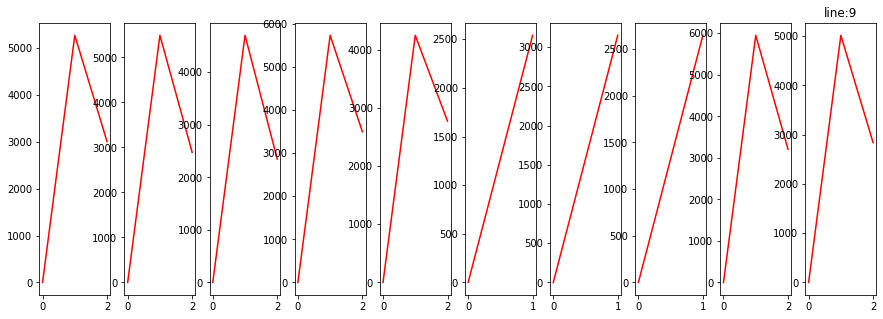

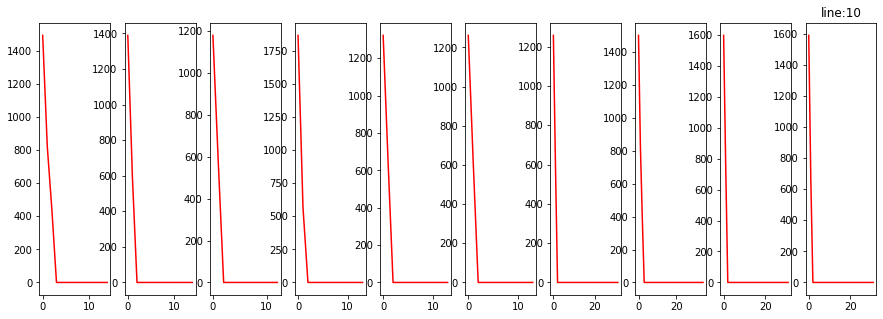

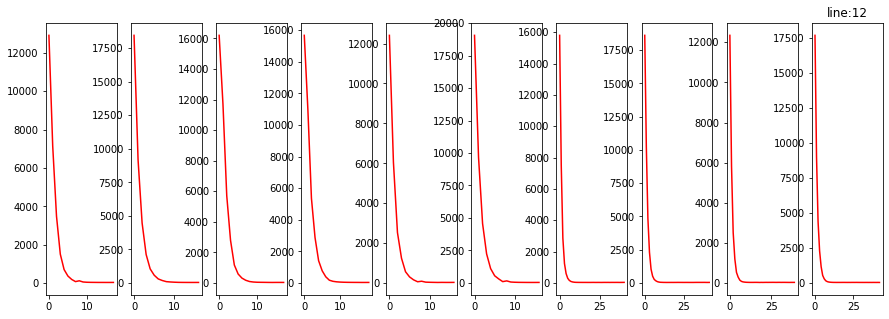

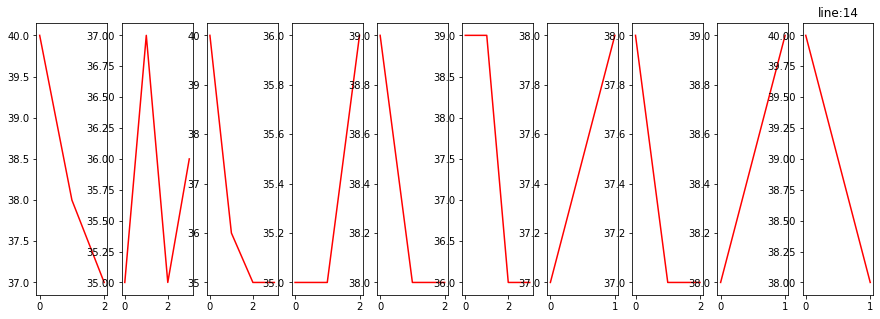

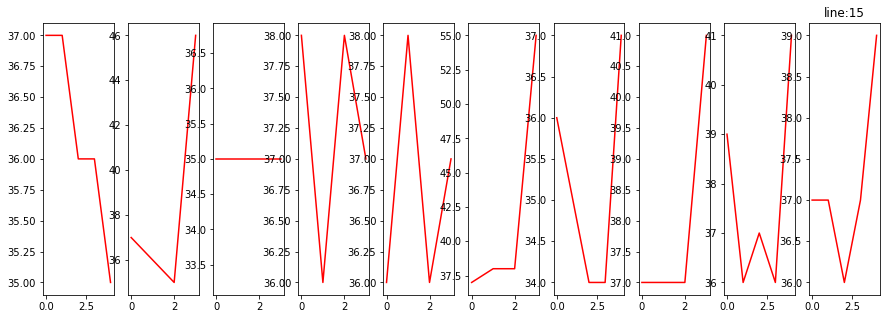

...

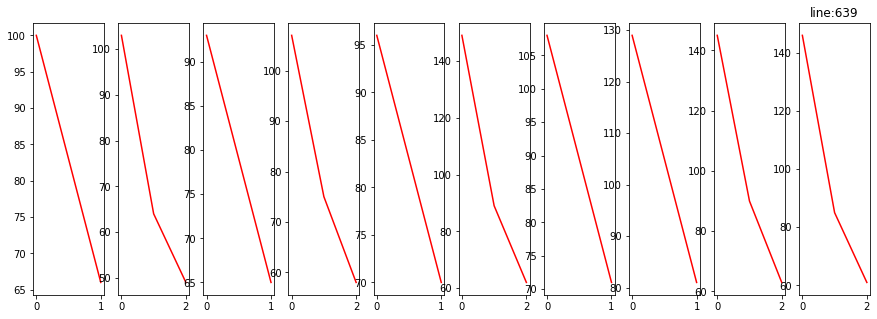

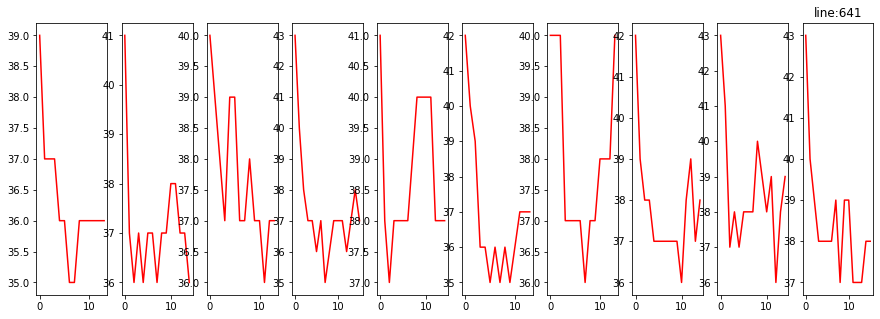

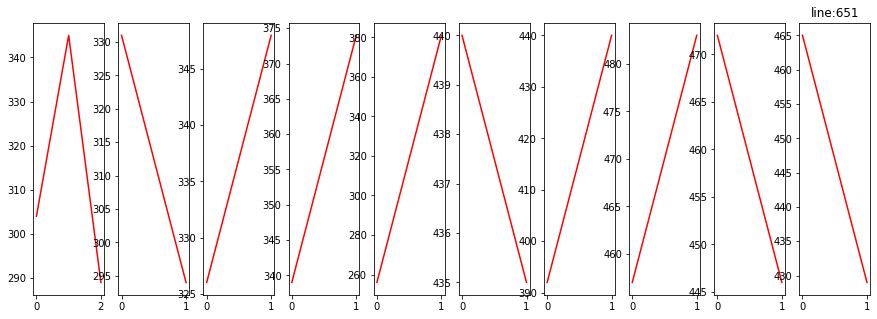

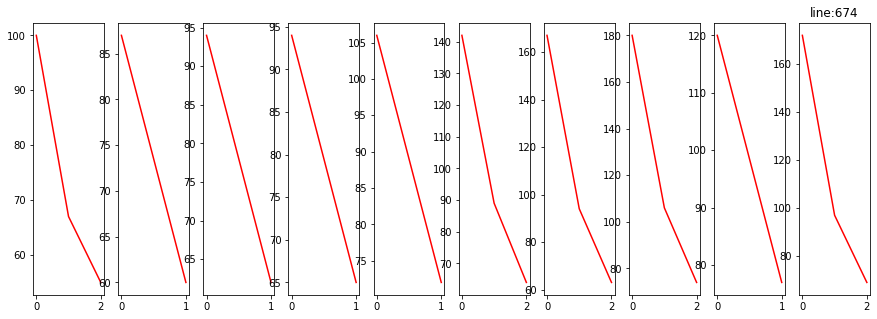

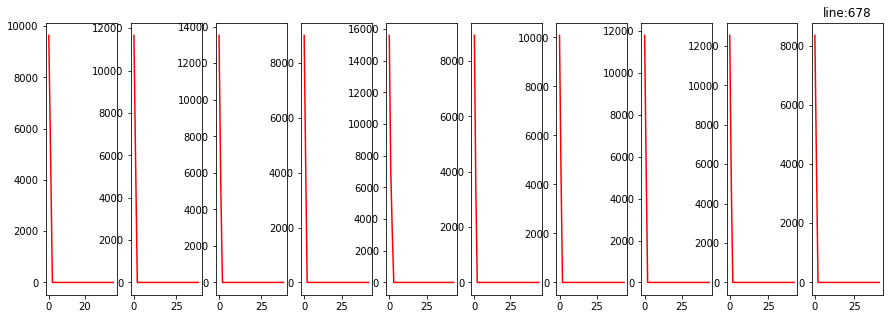

In [10]:
devno = 0
colors = ['r','g','b','y','k']
for line in allline:
    alllen2 = False
    for num in alldata:
        if len(alldata[num][line]['load']) < 3:
            alllen2 = True
            break
    if alllen2:
        continue
    for num in alldata:
        fig = plt.figure(devno + 1)
        fig.set_size_inches(15,5,forward=True)
        x = range(len(alldata[num][line]['load']))
        y = list(alldata[num][line]['load'])
        ax = fig.add_subplot(1,10,num)
        line1 = ax.plot(x,y,color = colors[devno % 5])
    plt.title("line:"+str(line))
    plt.show()

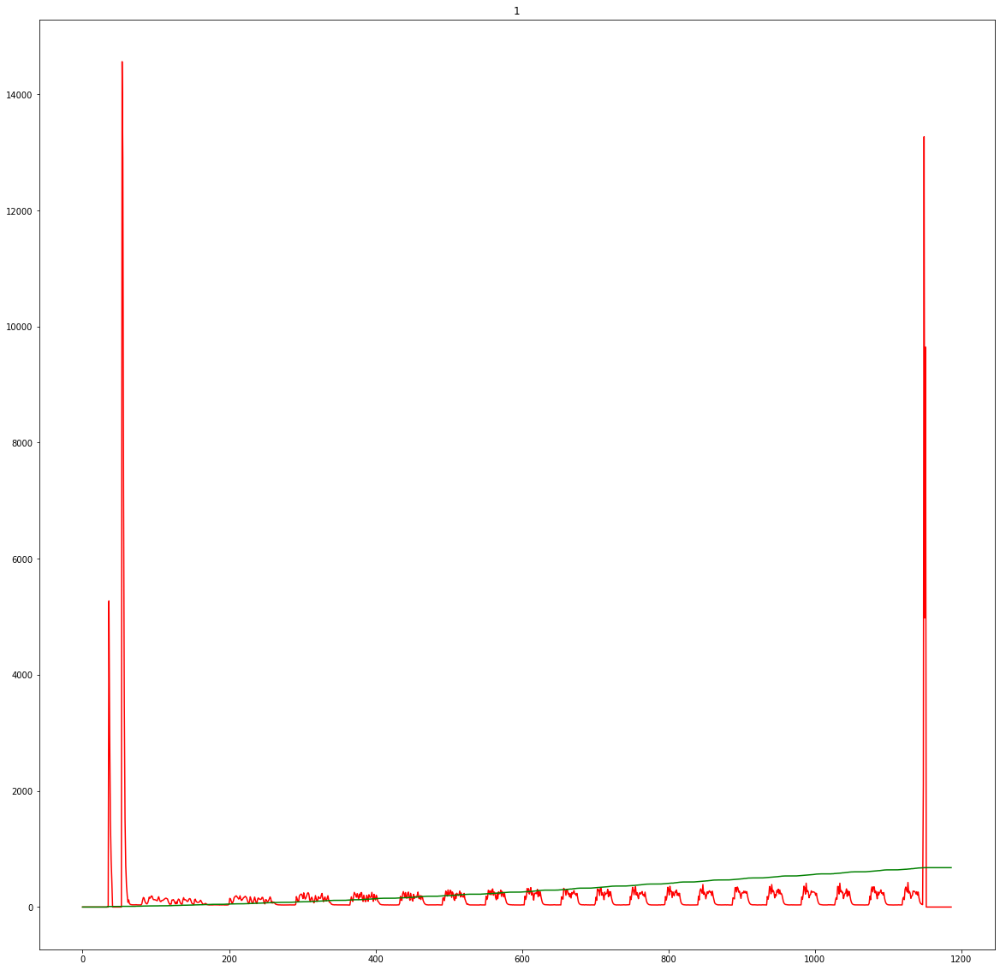

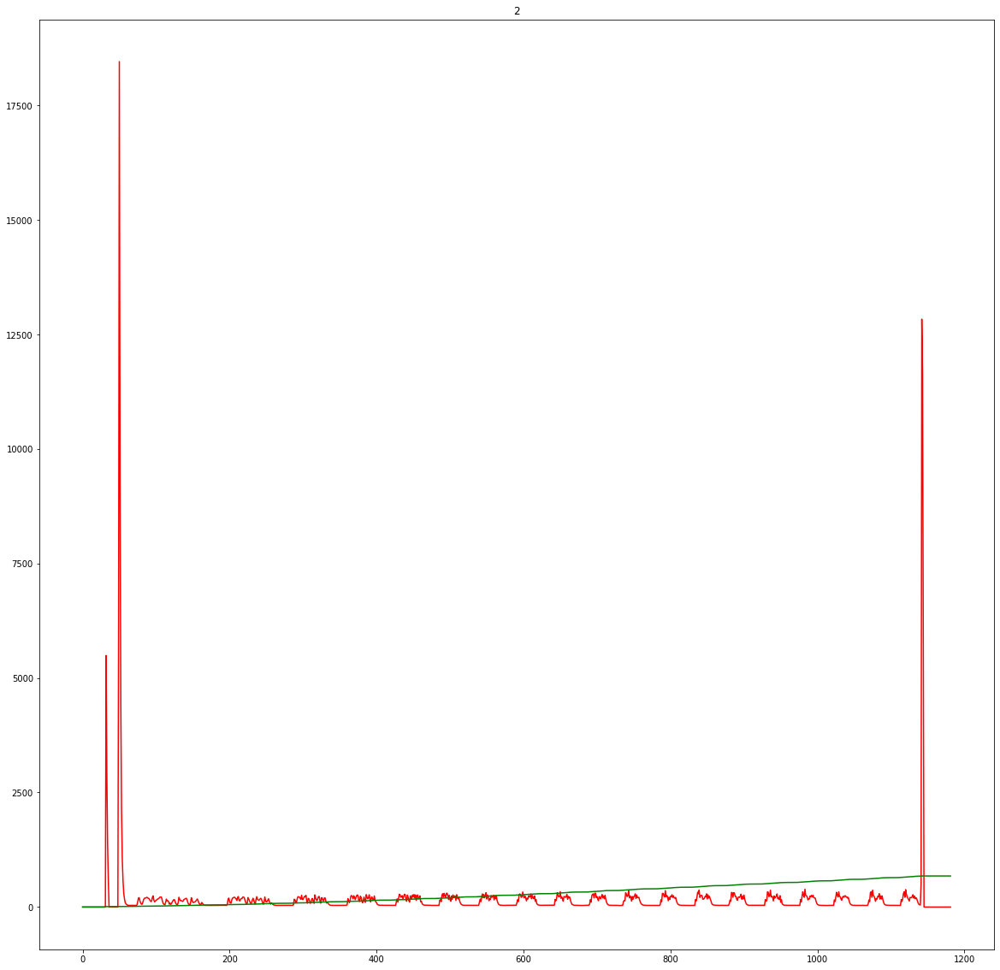

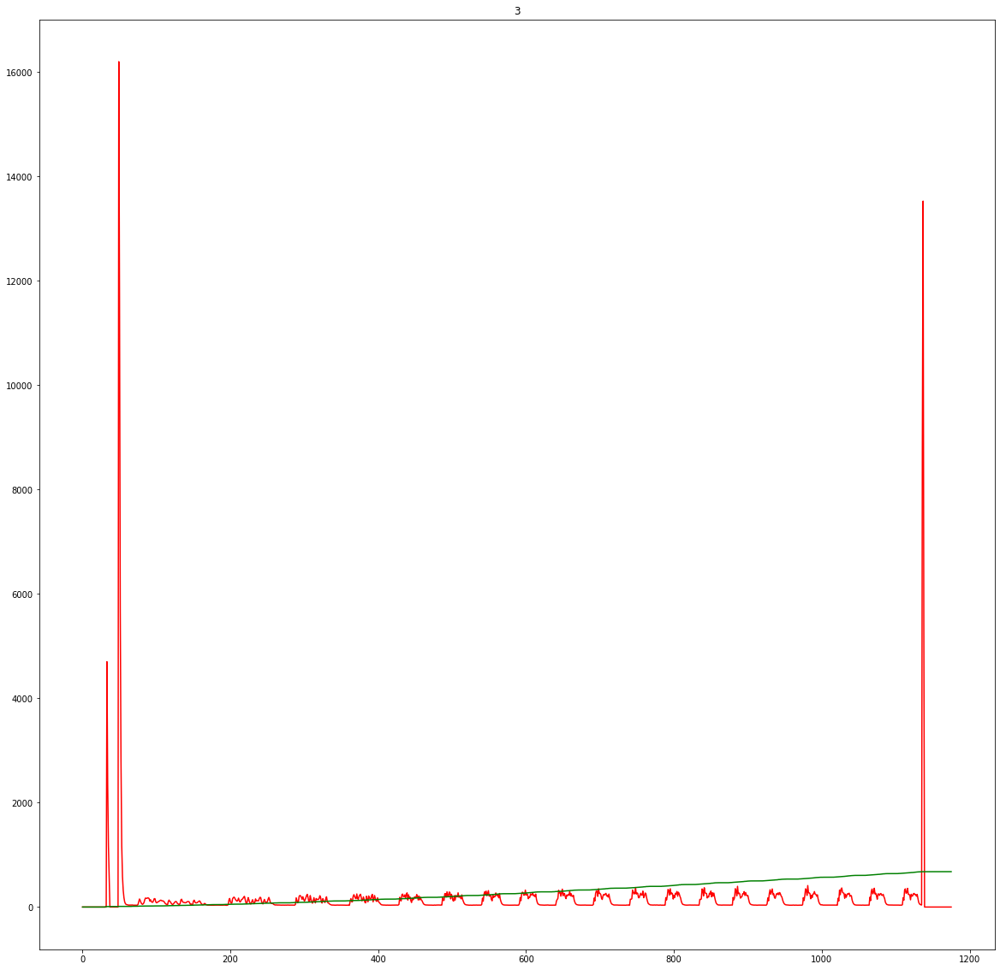

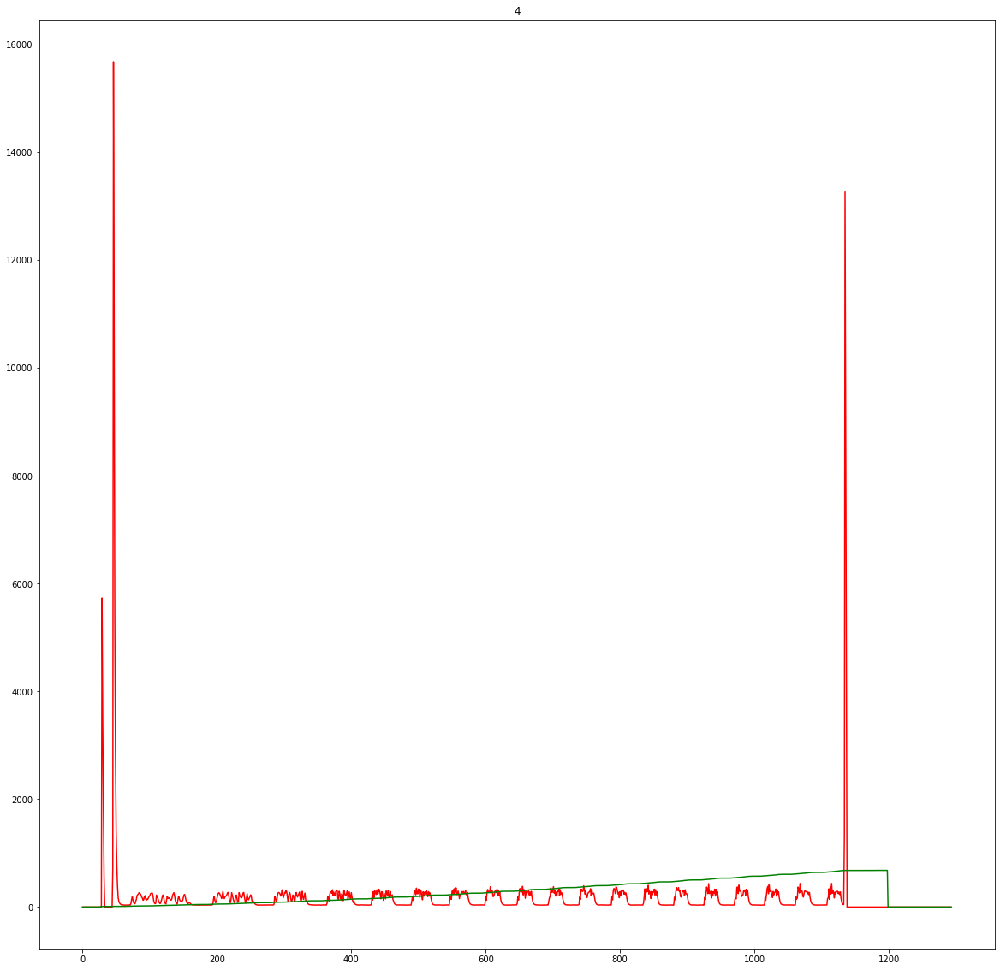

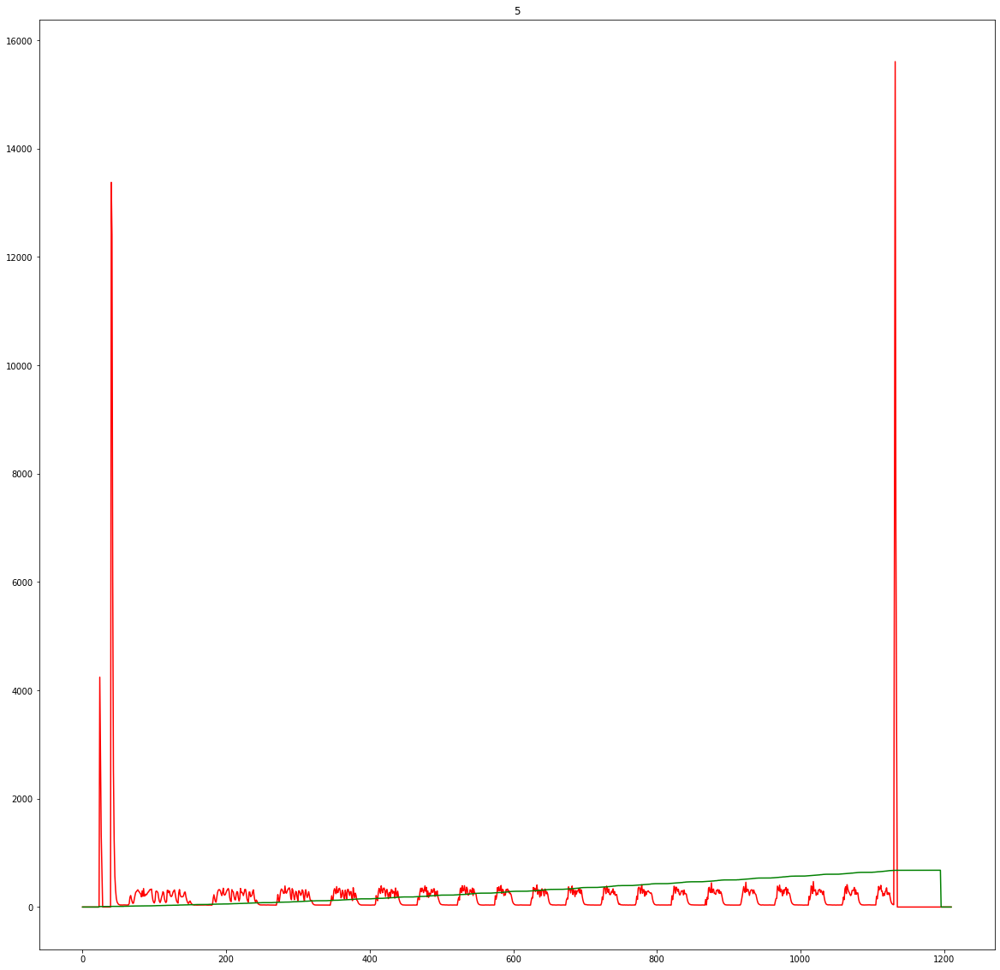

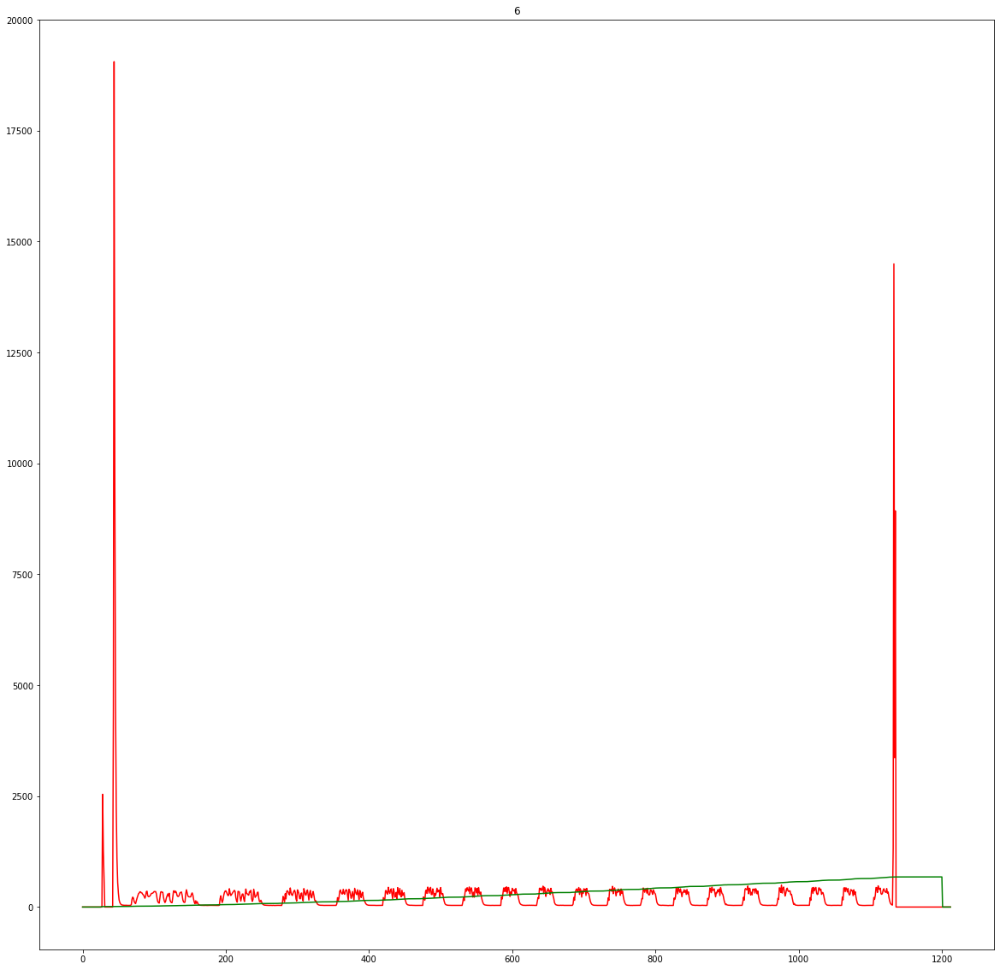

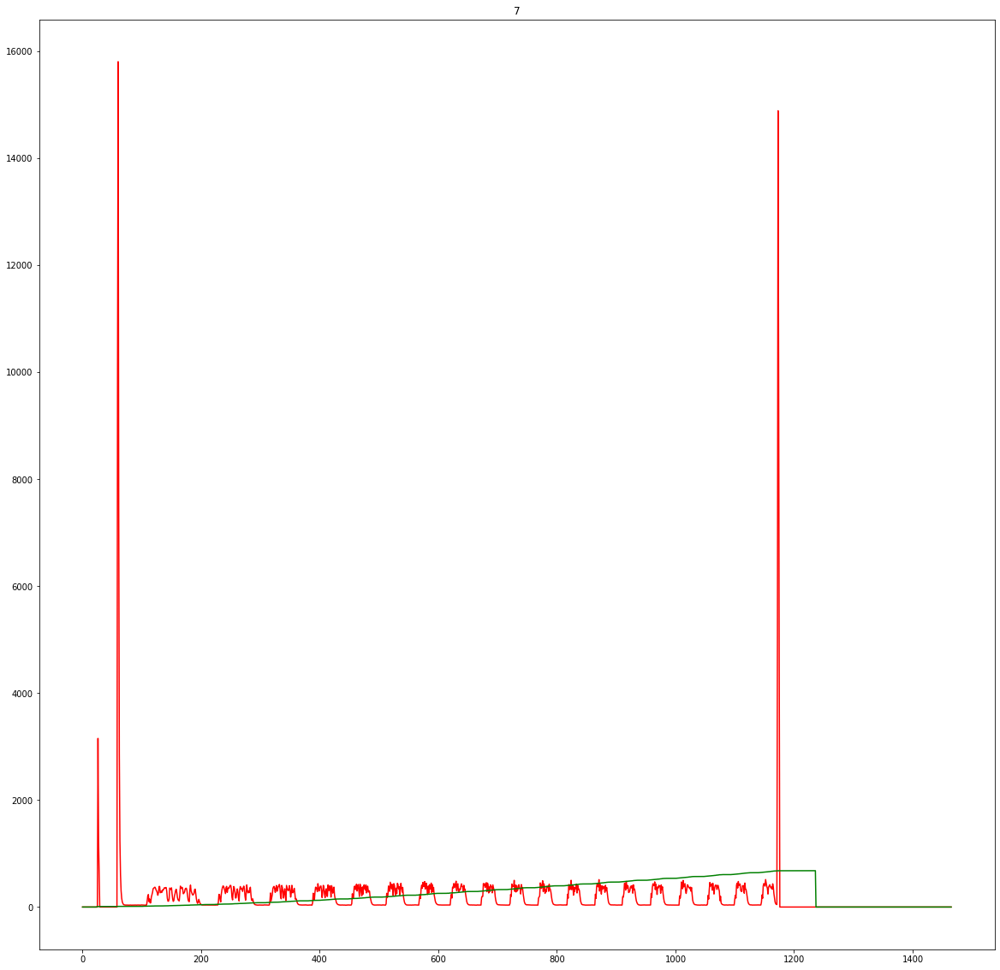

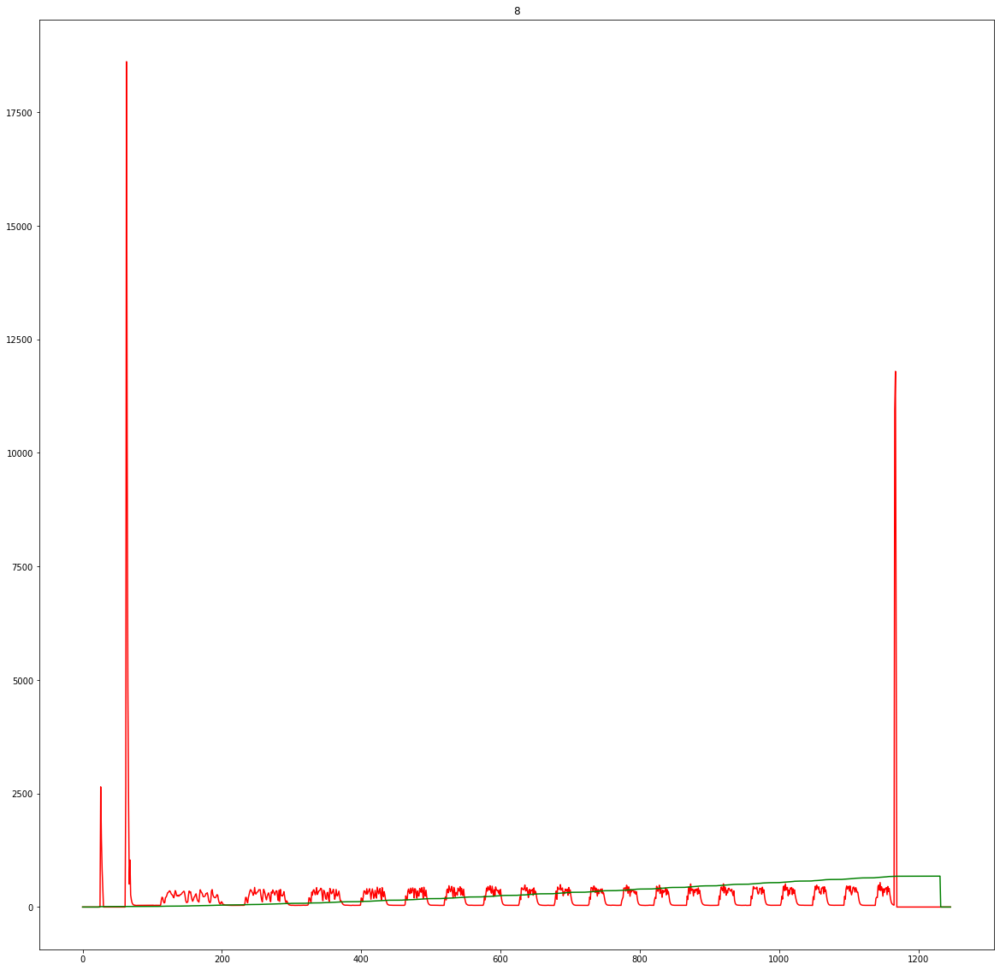

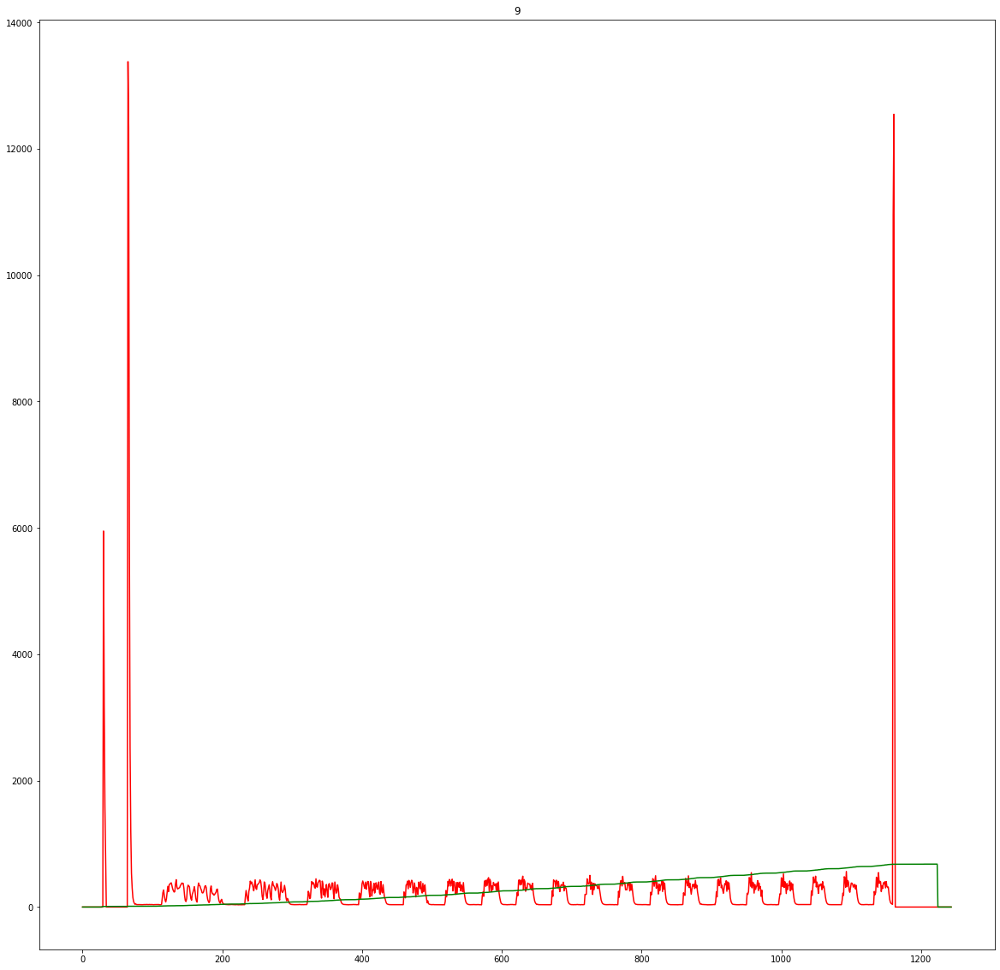

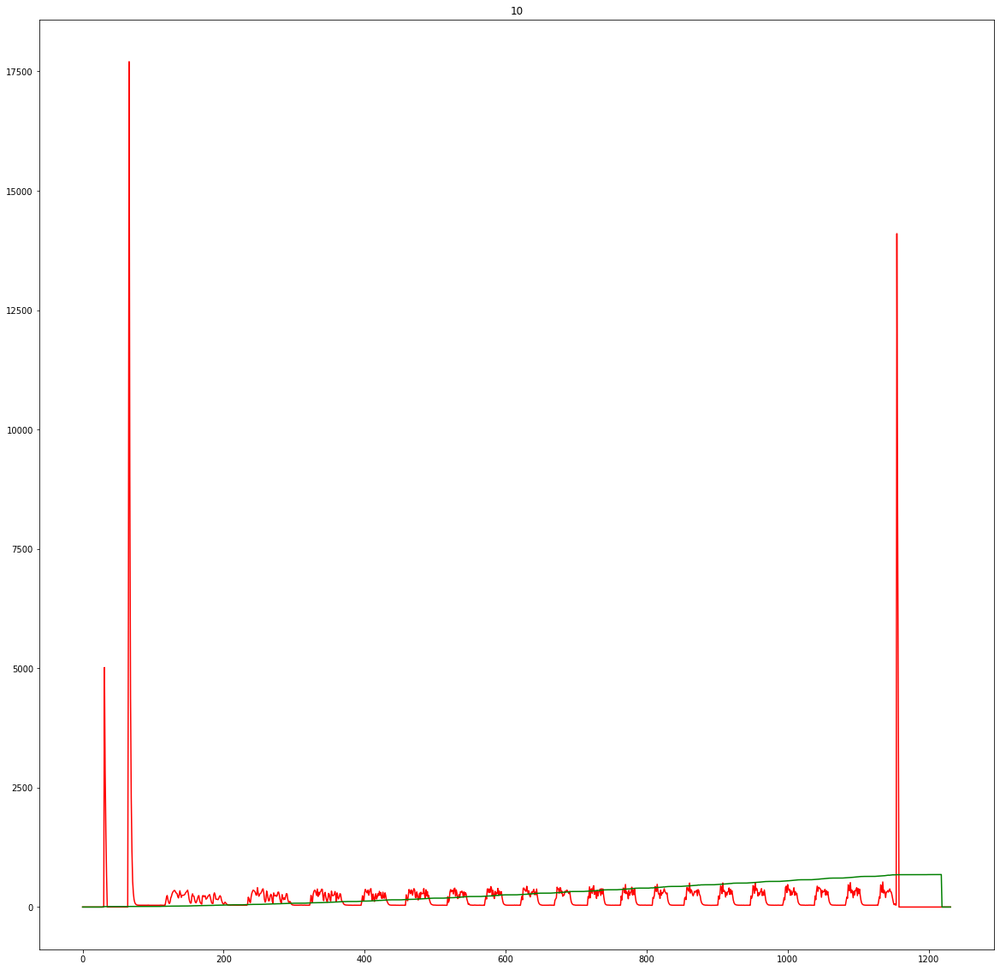

In [10]:
devno = 0
colors = ['r','g','b','y','k']
for num,tempdf in alldata.items():
    fig = plt.figure(devno + 1)
    fig.set_size_inches(20,20,forward=True)
    x = range(len(alldata[num]['load']))
    y1 = list(alldata[num]['load'])
    line1 = plt.plot(x,y1)
    plt.setp(line1,color = colors[0])
    y2 = list(alldata[num]['line'])
    line2 = plt.plot(x,y2)
    plt.setp(line2,color = colors[1])
    plt.title(num)
    plt.show()
    devno += 1